# Project Name – Santander Customer Transaction Prediction


### Background -
At Santander, mission is to help people and businesses prosper. We are always looking
for ways to help our customers understand their financial health and identify which
products and services might help them achieve their monetary goals.
Our data science team is continually challenging our machine learning algorithms,
working with the global data science community to make sure we can more accurately
identify new ways to solve our most common challenge, binary classification problems
such as: is a customer satisfied? Will a customer buy this product? Can a customer pay
this loan?

### Problem Statement -
In this challenge, we need to identify which customers will make a specific transaction in
the future, irrespective of the amount of money transacted.

# importing packages

In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
import pandas_profiling as pp
#overriding matplotlib with seaborn
sns.set()

# Exploratory Data Analysis (EDA)
<br>

## DATA Collection and Data Preview

In [2]:
strain = pd.read_csv('train.csv', low_memory=True ,memory_map= True)

In [3]:
strain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 202 entries, ID_code to var_199
dtypes: float64(200), int64(1), object(1)
memory usage: 308.2+ MB


In [4]:
strain.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


In [5]:
strain.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


#### using pandas profiling to get information about variables

In [6]:
data_profile = pp.ProfileReport(strain,check_correlation = False)
data_profile.to_file('dataset_profiling.html')

#### id_code is of no use so we will remove it

In [3]:
strain = strain.iloc[:,1:]
strain.head(2)

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0,8.9255,-6.7863,11.9081,5.093,11.4607,-9.2834,5.1187,18.6266,-4.9200,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,0,11.5006,-4.1473,13.8588,5.389,12.3622,7.0433,5.6208,16.5338,3.1468,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518


# Missing value analysis

In [8]:
missing_data_table =  pd.DataFrame(strain.isna().sum())
missing_data_table.rename(columns = {'index': 'Variables', 0: 'missing_val_status'}, inplace=True)

In [9]:
missing_data_table

,missing_val_status
target,0
var_0,0
var_1,0
var_2,0
var_3,0
...,...
var_195,0
var_196,0
var_197,0
var_198,0


In [10]:
missing_data_table[missing_data_table['missing_val_status']>0]

,missing_val_status


#### no missing value is present in the dataset

##  Dataset distribution according to target variable

0    179902
1     20098
Name: target, dtype: int64


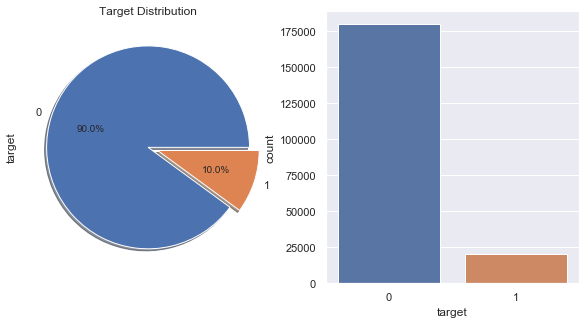

In [11]:
print(strain['target'].value_counts())
fig, axs = plt.subplots(figsize=(10,5), ncols=2, nrows=1)
strain['target'].value_counts().plot.pie(explode=(0,0.1), autopct='%1.1f%%',shadow=True,ax=axs[0])
axs[0].set_title('Target Distribution')
sns.countplot('target',data=strain,ax=axs[1])

#### clearly the data is inbalanced and leaning toward 0 more than 1
<br>

# Correlation Analysis

In [12]:
strain.iloc[:,1:].corr().style.background_gradient(cmap=plt.get_cmap('Reds'))

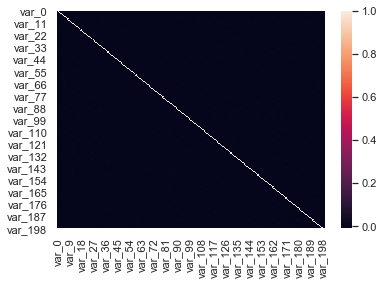

In [13]:
sns.heatmap(strain.iloc[:,1:].corr())

#### we can clearly see that there is no  correlation between variables

# Variable Distribution analysis

#### Plotting KDE for all Variables

<Figure size 432x288 with 0 Axes>

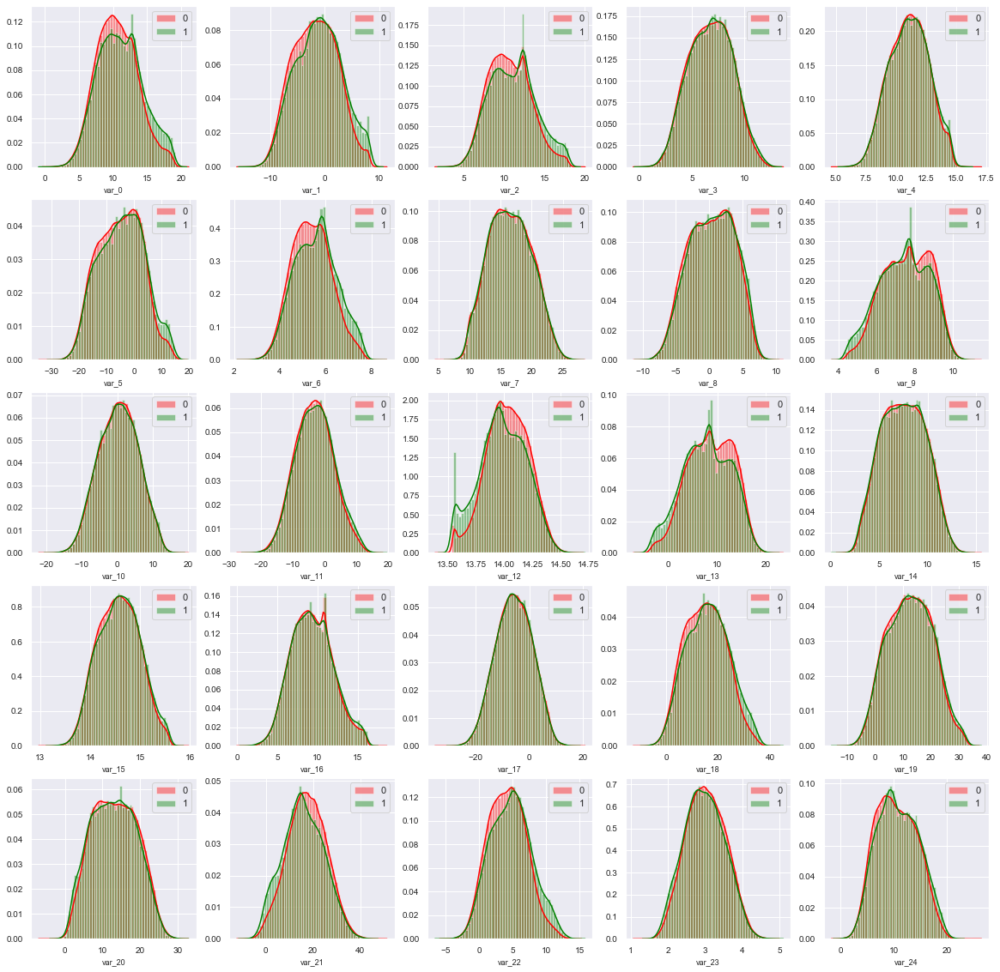

<Figure size 432x288 with 0 Axes>

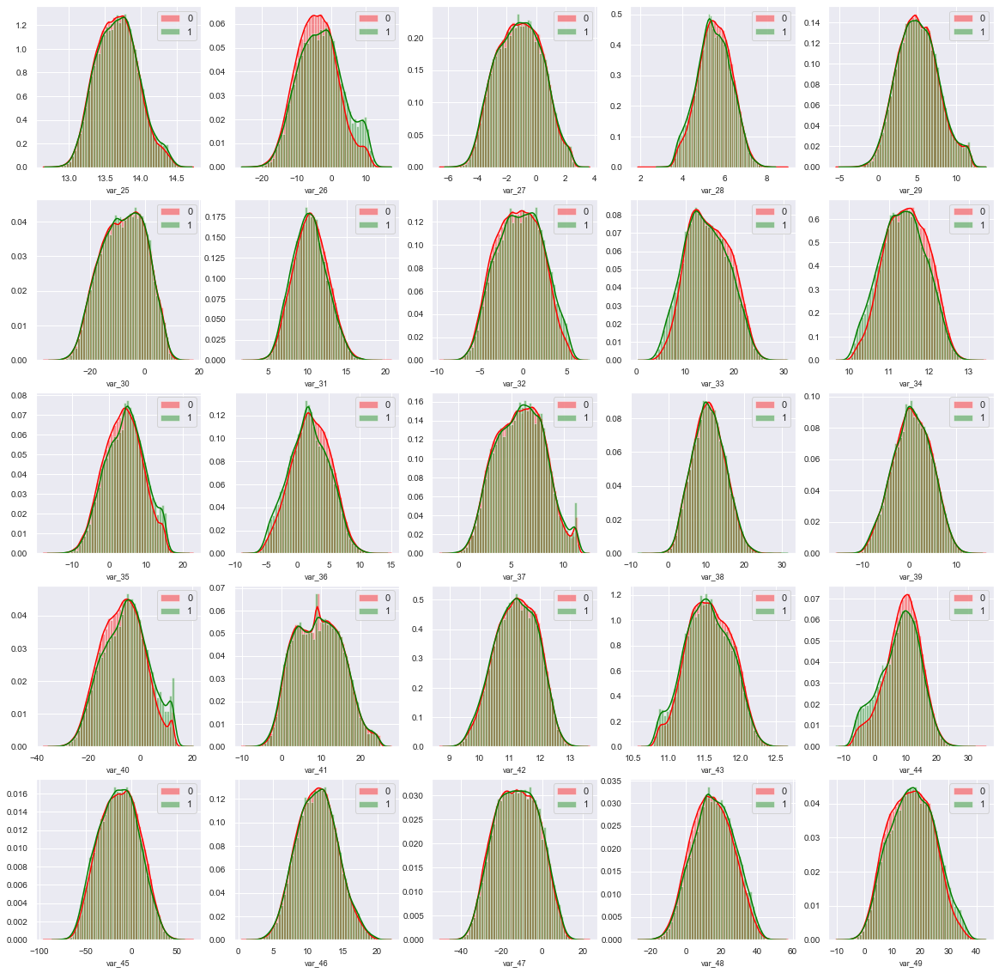

<Figure size 432x288 with 0 Axes>

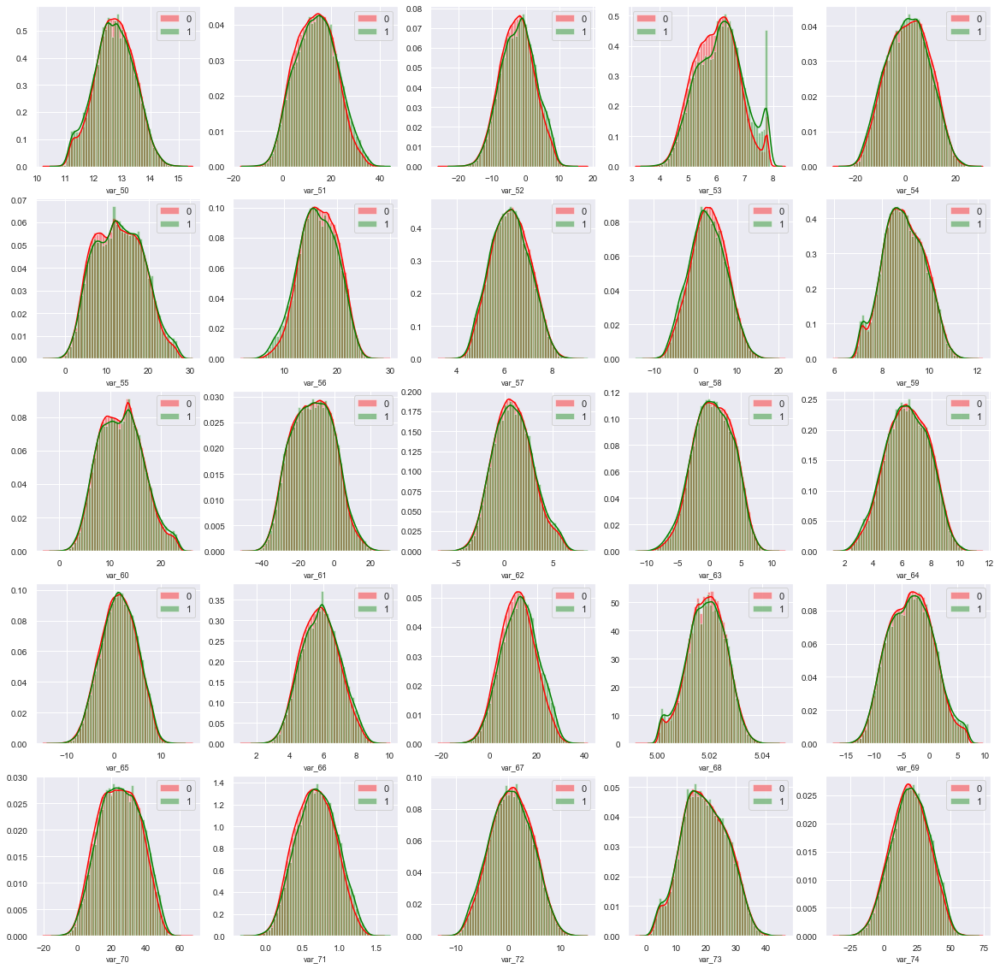

<Figure size 432x288 with 0 Axes>

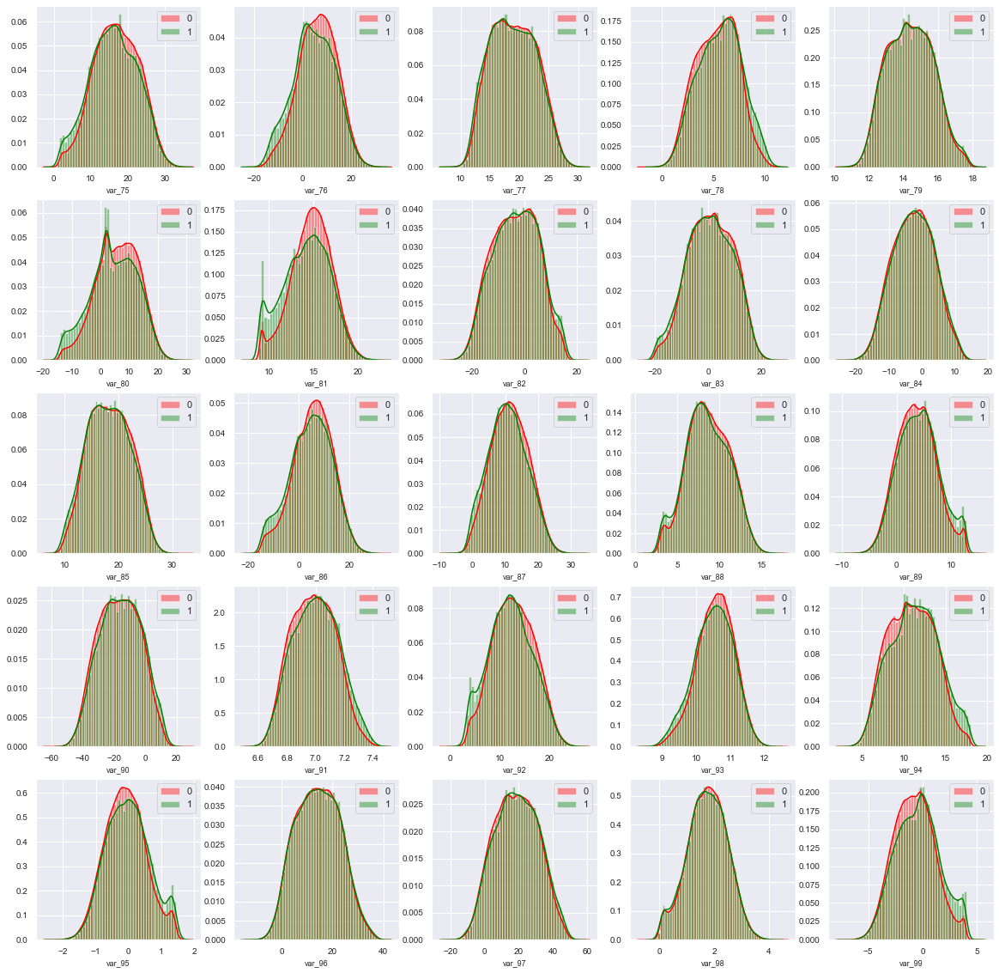

<Figure size 432x288 with 0 Axes>

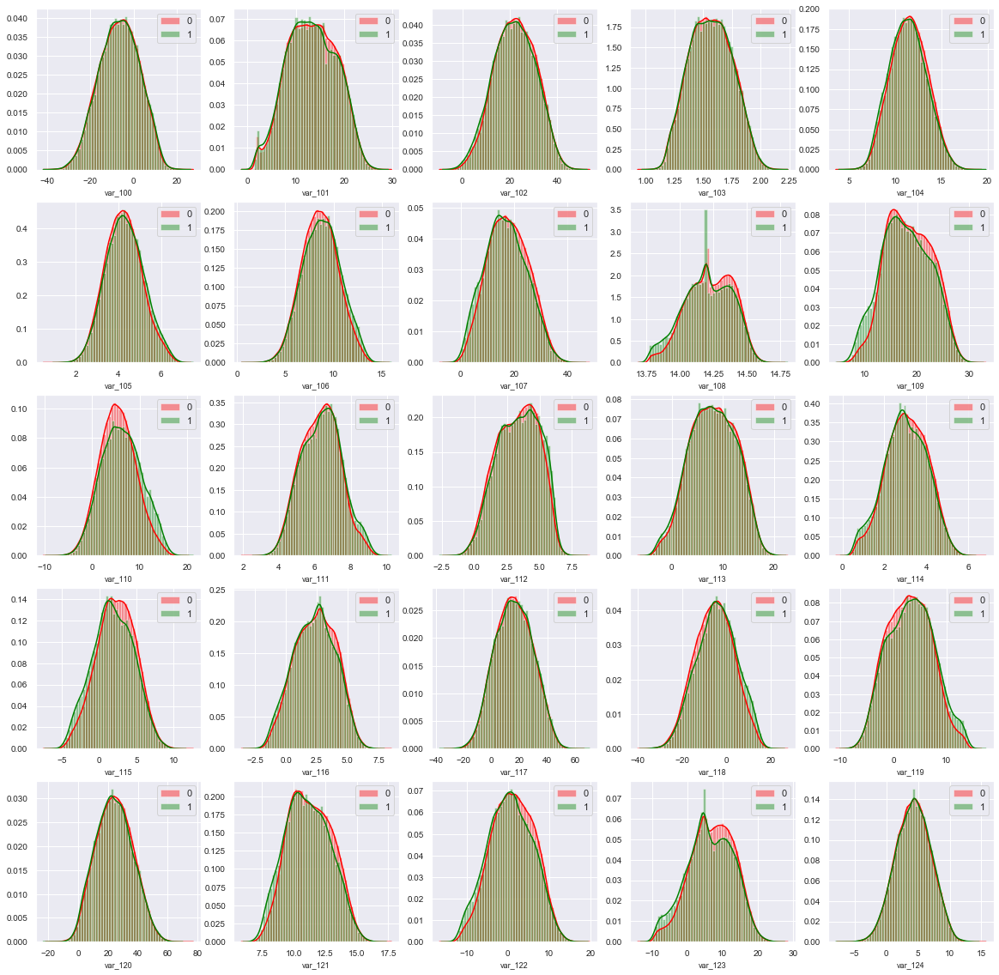

<Figure size 432x288 with 0 Axes>

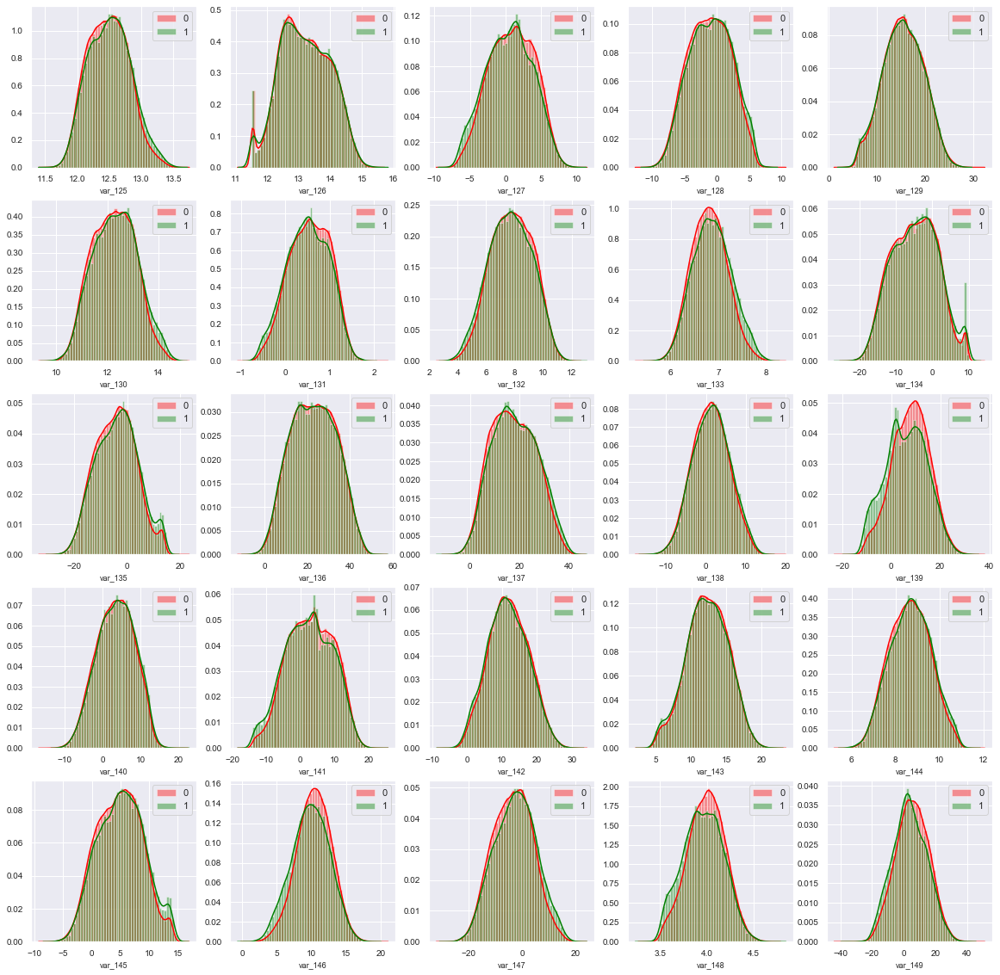

<Figure size 432x288 with 0 Axes>

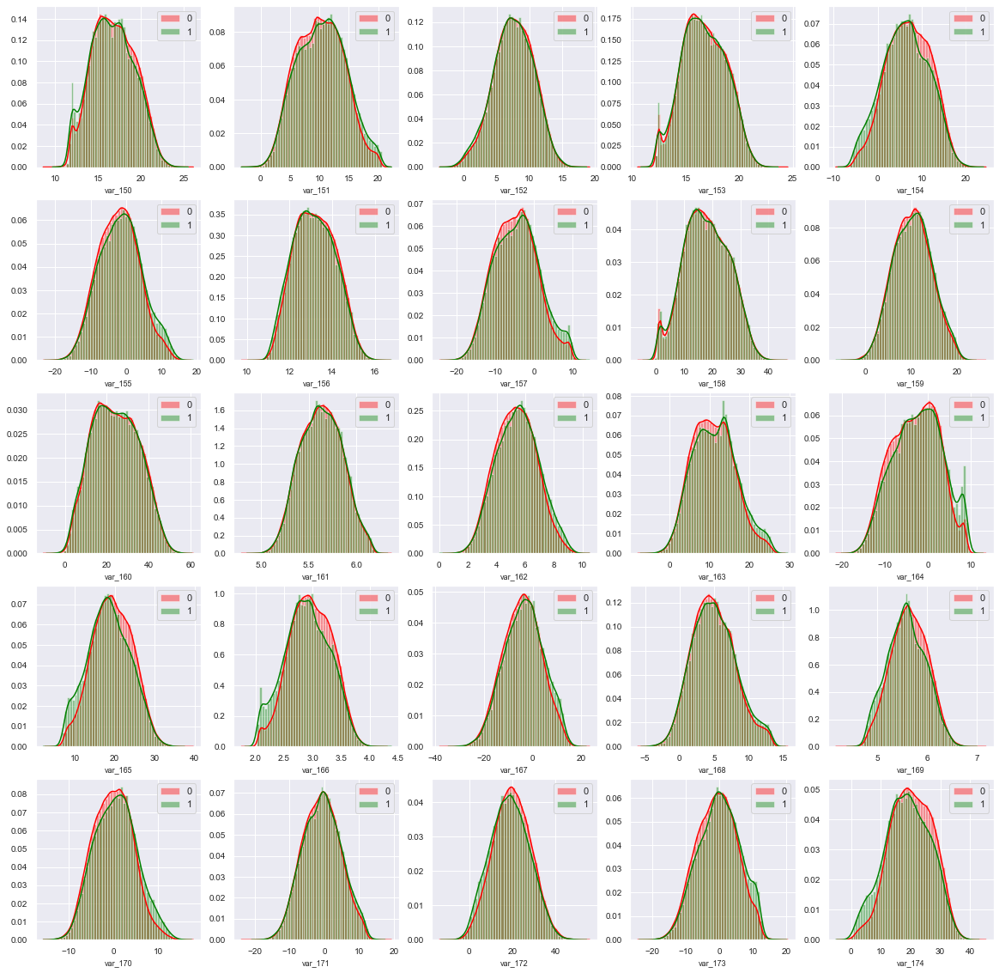

<Figure size 432x288 with 0 Axes>

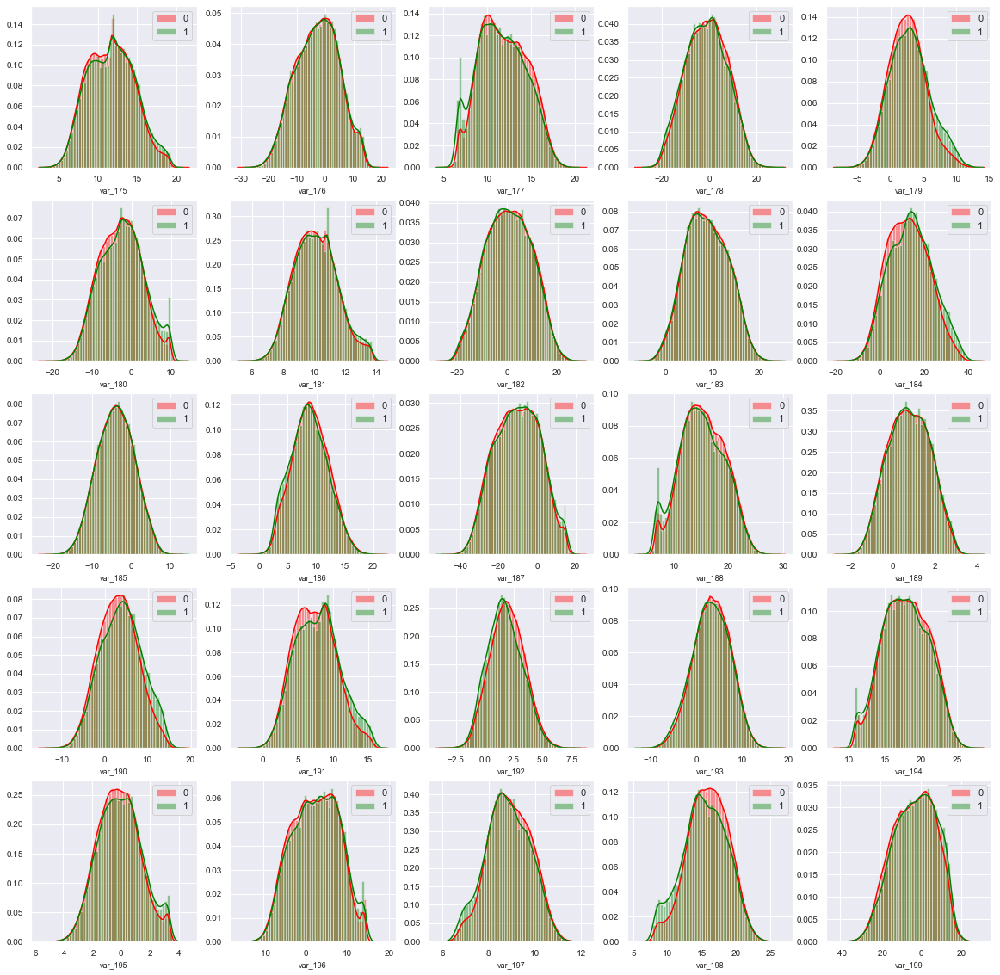

In [14]:
def plot_feature_distribution(df1, df2, label1, label2, features):
    i = 0
    plt.figure()
    fig, ax = plt.subplots(5,5,figsize=(20,20))

    for feature in features:
        i += 1
        plt.subplot(5,5,i)
        sns.distplot(df1[feature],label=label1, color='red')
        sns.distplot(df2[feature],label=label2, color='green')
        plt.xlabel(feature, fontsize=9)
        plt.tick_params(axis='x', which='major', labelsize=10)
        plt.tick_params(axis='y', which='major', labelsize=10)
        plt.legend()
    plt.show()
    
t0 = strain.loc[strain['target'] == 0]
t1 = strain.loc[strain['target'] == 1]

for f in range(1,178,25):
    features = strain.columns.values[f:f+25]
    plot_feature_distribution(t0, t1, '0', '1', features)

#### inference from the KDE plots above

- if we look closely var_2, var_9, var_12, var_13, var_26, var_40, var_53, var_81 and many others have resemblance of a bimodal type distribution.
- All of these variables have a bump of frequency that matches the rising of the probability of making a transaction.

#### replace target categories with Yes or No

In [15]:
# strain['target'] = strain['target'].replace(0, 'No')
# strain['target']= strain['target'].replace(1, 'Yes')

In [16]:
strain.head()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


## Outlier Analysis

In [17]:
outlier_analysis=pd.DataFrame()
for i in range(1,201,50):
    outlier_analysis=outlier_analysis.append(strain.iloc[:,i:i+50].quantile([.75,.25]).transpose())
outlier_analysis.reset_index(inplace= True)
outlier_analysis.rename(columns ={'index':"variables",0.75:'Q3',0.25:"Q1"},inplace =True)
outlier_analysis['IQR']=outlier_analysis['Q3']-outlier_analysis['Q1']
outlier_analysis['minline'] = outlier_analysis['Q1']-1.5*outlier_analysis['IQR']
outlier_analysis['maxline'] = outlier_analysis['Q3']+1.5*outlier_analysis['IQR']
outlier_analysis['outliers']= np.NaN
for i,row in outlier_analysis.iterrows():
    outlier_analysis.loc[i,'outliers'] = len(strain[strain[row.variables] < row.minline].index)+\
                                         len(strain[strain[row.variables] > row.maxline].index)

In [18]:
outlier_analysis

,variables,Q3,Q1,IQR,minline,maxline,outliers
0,var_0,12.758200,8.453850,4.304350,1.997325,19.214725,104.0
1,var_1,1.358625,-4.740025,6.098650,-13.888000,10.506600,6.0
2,var_2,12.516700,8.722475,3.794225,3.031137,18.208038,49.0
3,var_3,8.324100,5.254075,3.070025,0.649038,12.929137,22.0
4,var_4,12.261125,9.883175,2.377950,6.316250,15.828050,76.0
...,...,...,...,...,...,...,...
195,var_195,0.829600,-1.170700,2.000300,-4.171150,3.830050,132.0
196,var_196,6.556725,-1.946925,8.503650,-14.702400,19.312200,0.0
197,var_197,9.593300,8.252800,1.340500,6.242050,11.604050,51.0
198,var_198,18.064725,13.829700,4.235025,7.477163,24.417262,94.0


AS we can see there are outliers in almost every variable these outliers might be important in prediction so we will look for that in future

<Figure size 432x288 with 0 Axes>

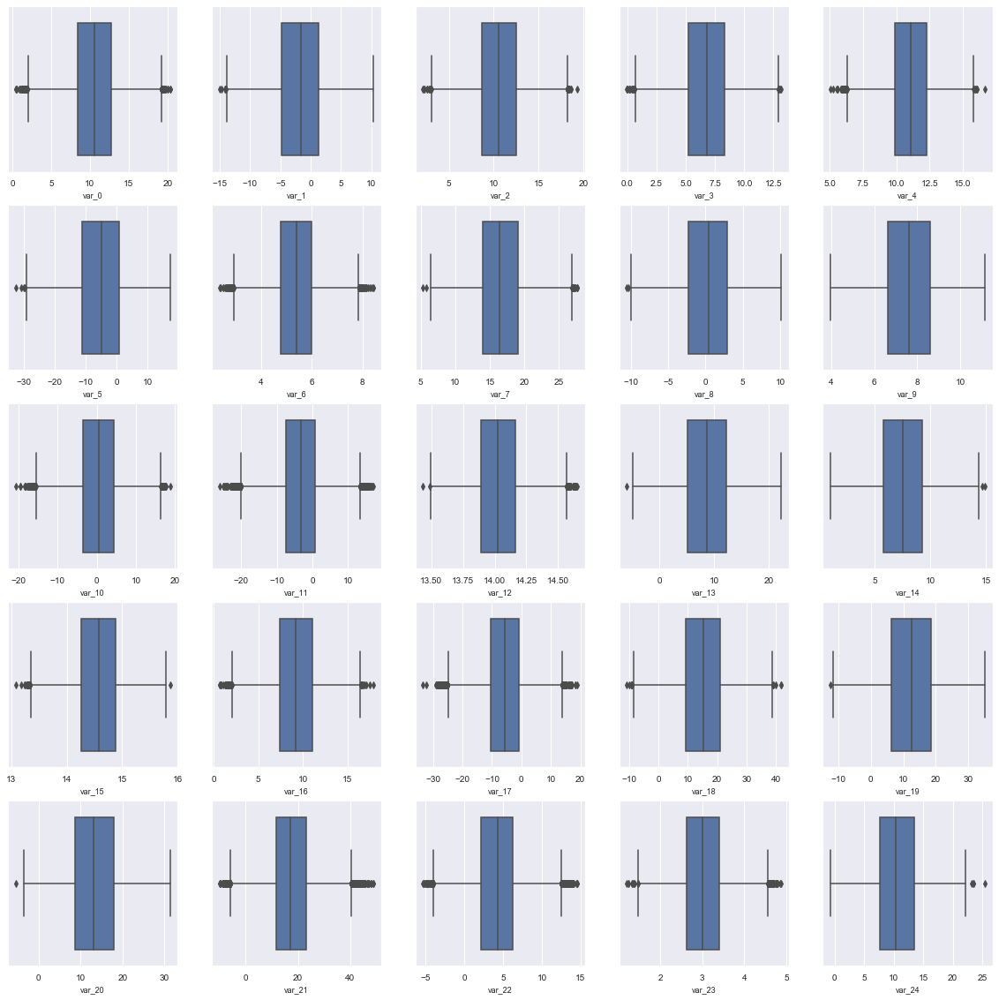

<Figure size 432x288 with 0 Axes>

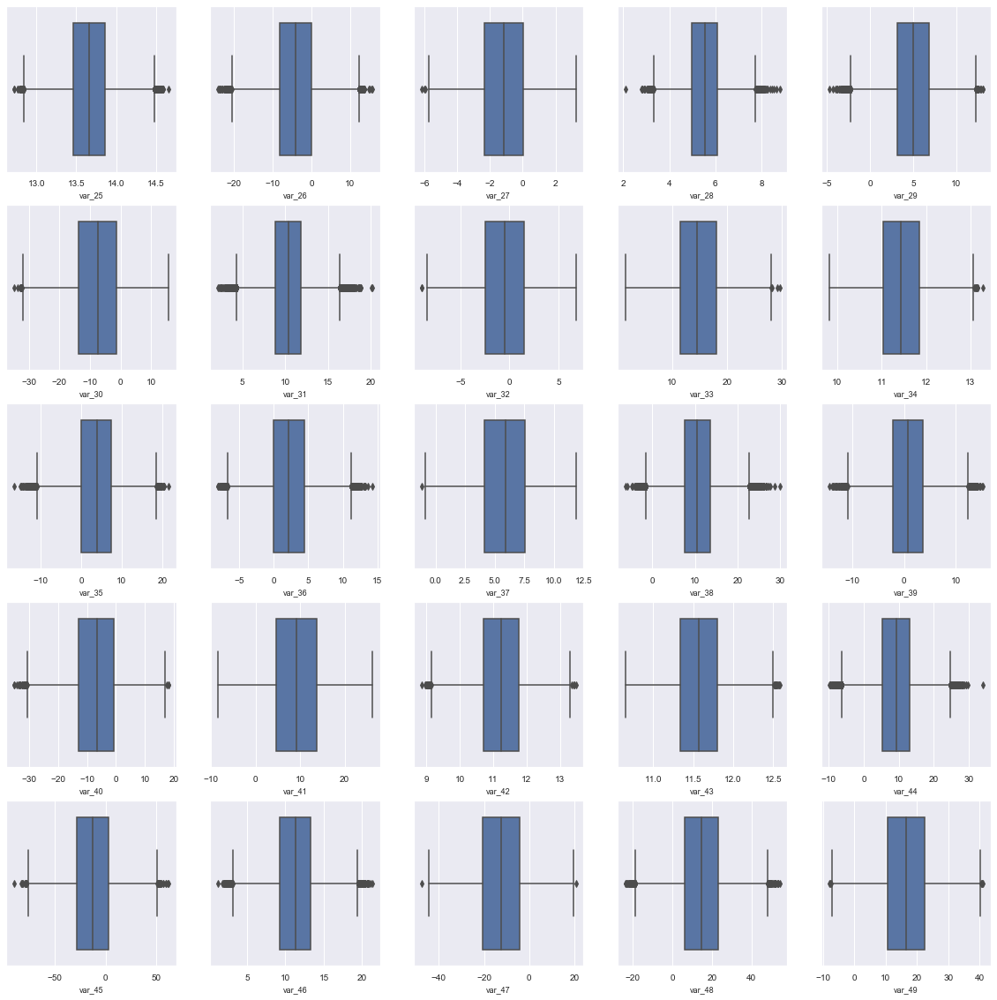

<Figure size 432x288 with 0 Axes>

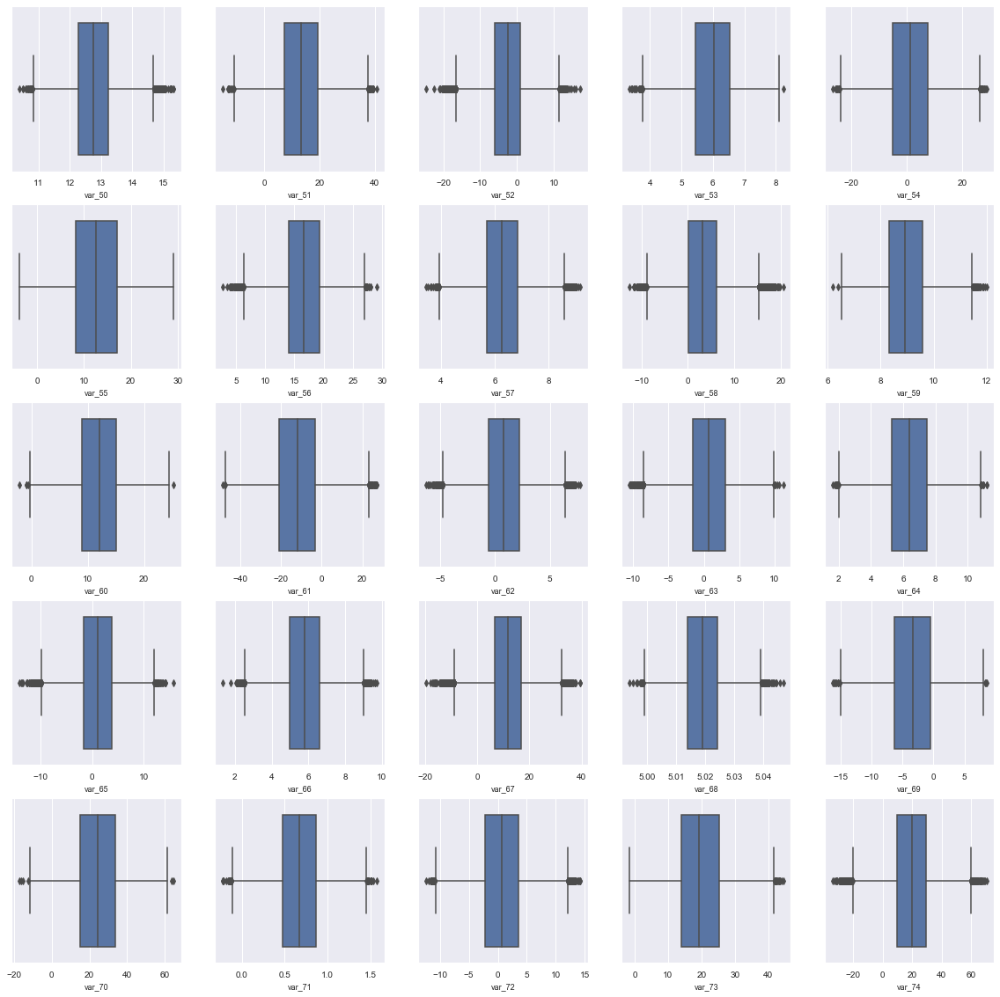

<Figure size 432x288 with 0 Axes>

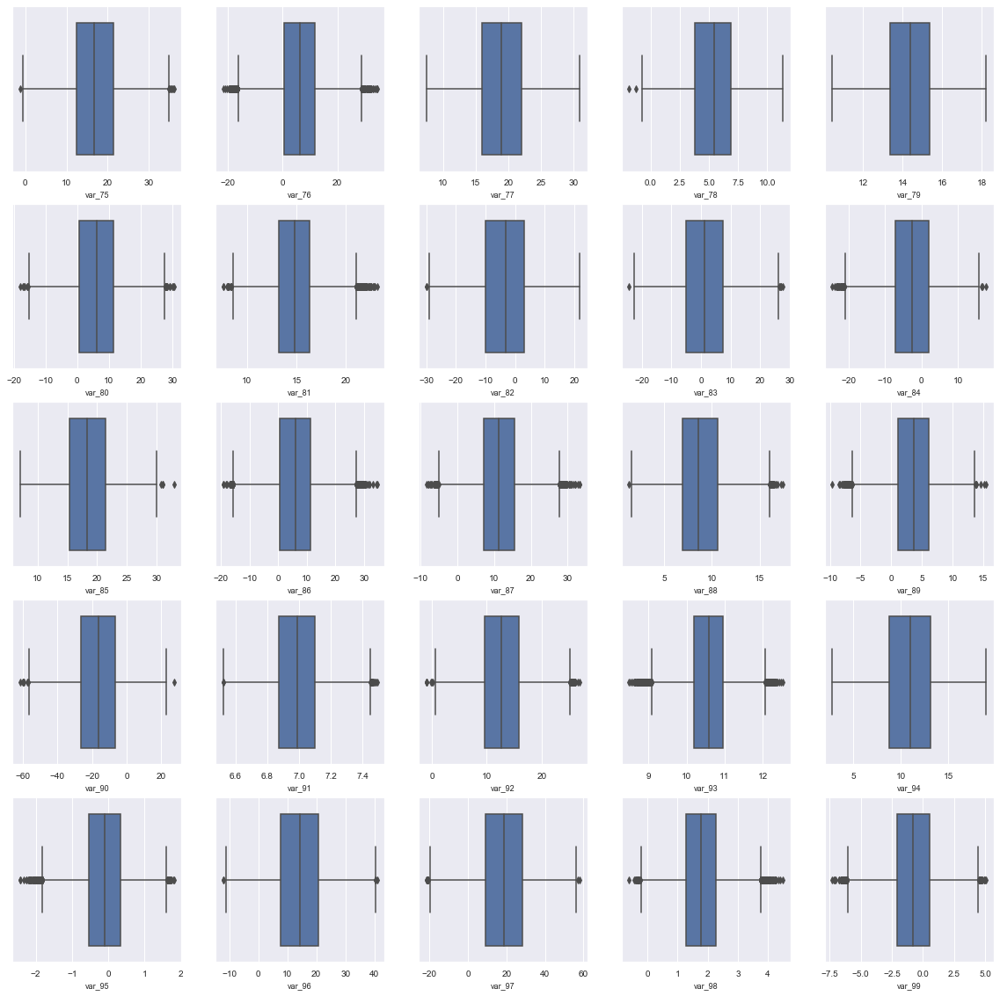

<Figure size 432x288 with 0 Axes>

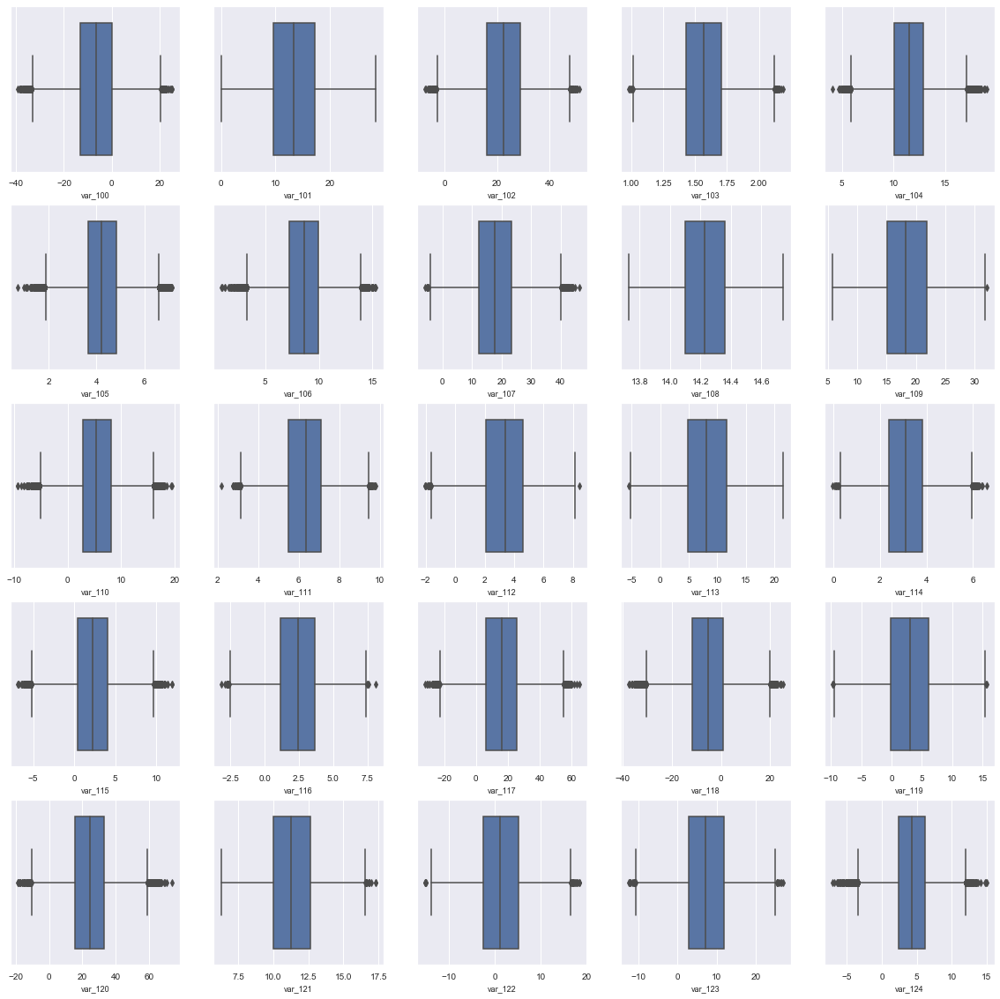

<Figure size 432x288 with 0 Axes>

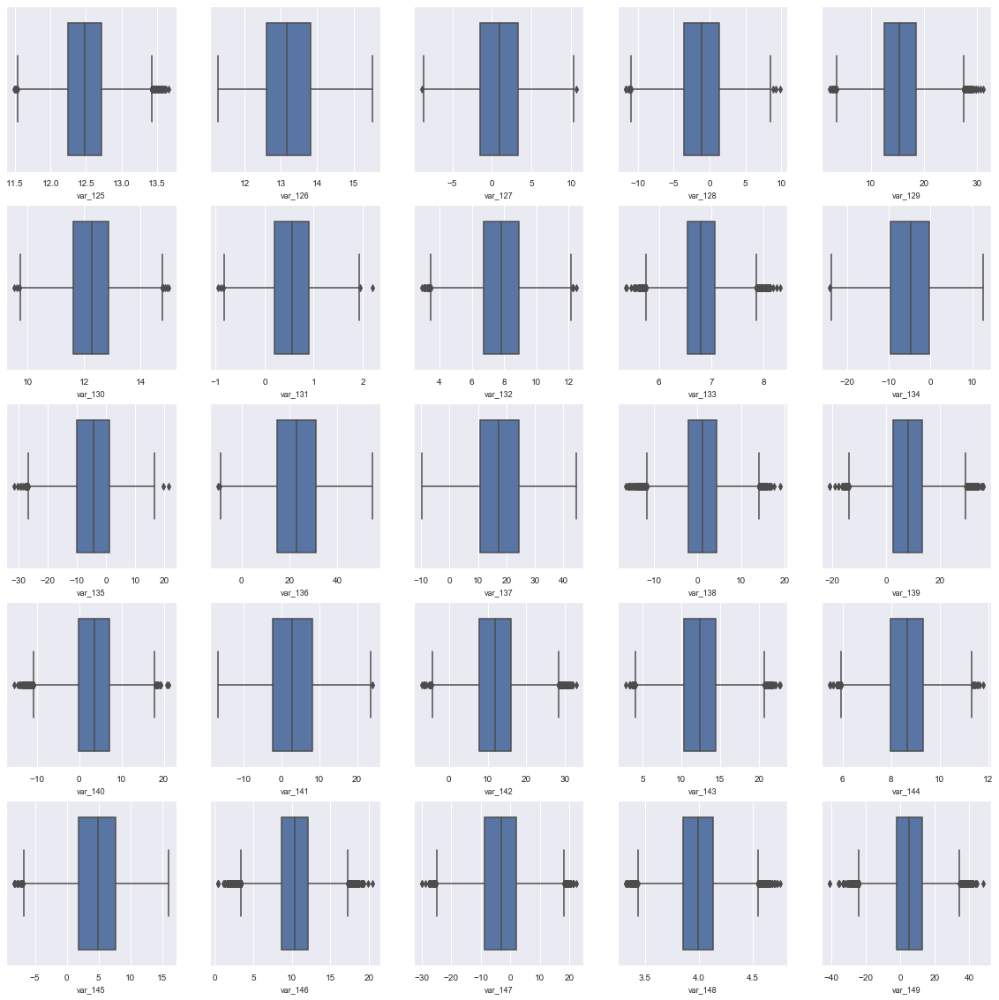

<Figure size 432x288 with 0 Axes>

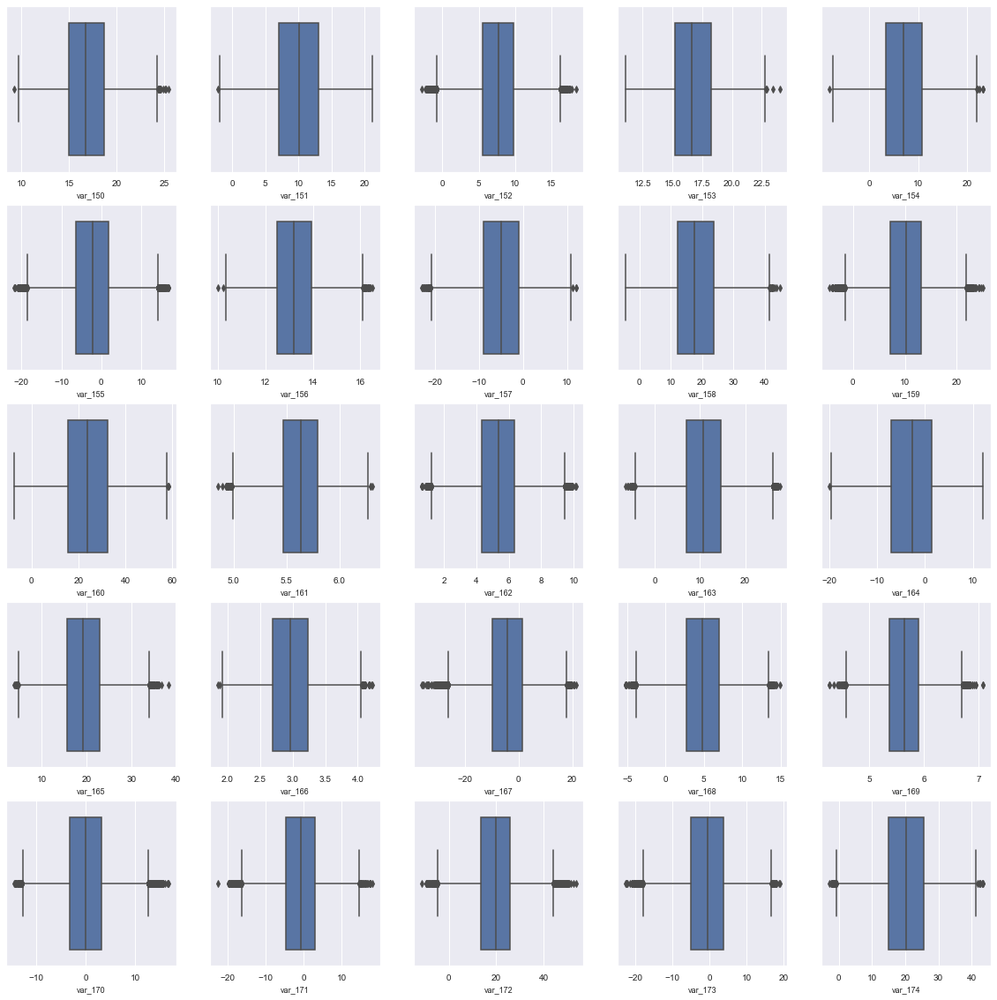

<Figure size 432x288 with 0 Axes>

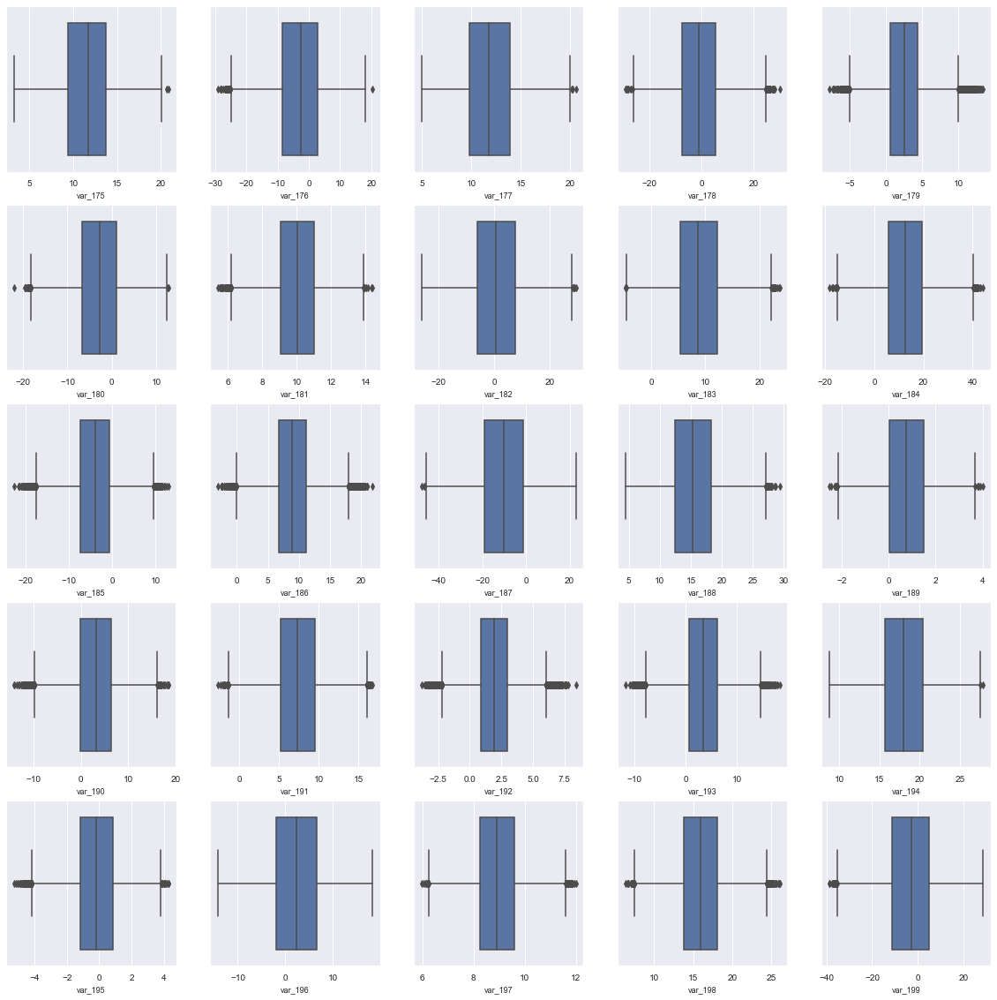

In [19]:
def plot_feature_boxplot(df,features):
    i = 0
    plt.figure()
    fig, ax = plt.subplots(5,5,figsize=(20,20))

    for feature in features:
        i += 1
        plt.subplot(5,5,i)
        sns.boxplot(df[feature])
        plt.xlabel(feature, fontsize=9)
        plt.tick_params(axis='x', which='major', labelsize=10)
        plt.tick_params(axis='y', which='major', labelsize=10)
    plt.show()
for f in range(1,178,25):
    features = strain.columns.values[f:f+25]
    plot_feature_boxplot(strain,features)

here we will try to make two separate df (outliers and without outliers) and check the distribution there

In [20]:
outliers_index = []
for i,row in outlier_analysis.iterrows():
    outliers_index.extend(list(strain[strain[row.variables] < row.minline].index))
    outliers_index.extend(list(strain[strain[row.variables] > row.maxline].index))
outliers_index=list(set(outliers_index))
df_in = strain.drop(outliers_index,axis=0)

0    157999
1     17105
Name: target, dtype: int64


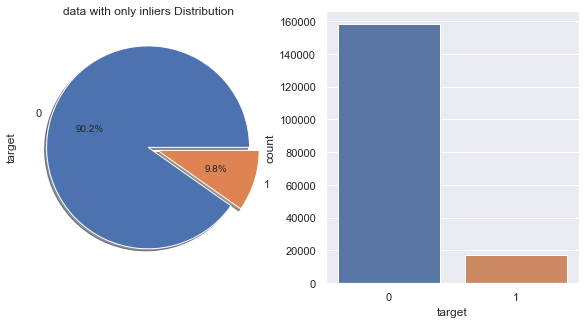

In [21]:
print(df_in['target'].value_counts())
fig, axs = plt.subplots(figsize=(10,5), ncols=2, nrows=1)
df_in['target'].value_counts().plot.pie(explode=(0,0.1), autopct='%1.1f%%',shadow=True,ax=axs[0])
axs[0].set_title('data with only inliers Distribution')
sns.countplot('target',data=df_in,ax=axs[1])

In [22]:
df_in.head()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104
5,0,11.4763,-2.3182,12.6080,8.6264,10.9621,3.5609,4.5322,15.2255,3.5855,...,-6.3068,6.6025,5.2912,0.4403,14.9452,1.0314,-3.6241,9.7670,12.5809,-4.7602


In [23]:
df_out = strain.iloc[outliers_index]

0    21903
1     2993
Name: target, dtype: int64


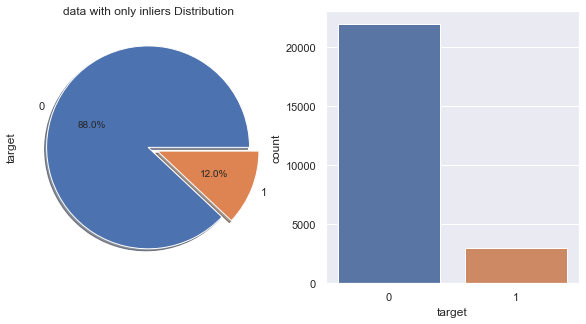

In [24]:
print(df_out['target'].value_counts())
fig, axs = plt.subplots(figsize=(10,5), ncols=2, nrows=1)
df_out['target'].value_counts().plot.pie(explode=(0,0.1), autopct='%1.1f%%',shadow=True,ax=axs[0])
axs[0].set_title('data with only inliers Distribution')
sns.countplot('target',data=df_out,ax=axs[1])

# Feature Scaling

most of the model are sensetive to range so we will scaled the variable in definite range

In [4]:
#Nomalisation
for i in df_in.iloc[:,1:]:
    df_in[i] = (df_in[i] - min(df_in[i]))/(max(df_in[i]) - min(df_in[i]))
for i in strain.iloc[:,1:]:
    strain[i] = (strain[i] - min(strain[i]))/(max(strain[i]) - min(strain[i]))

In [26]:
df_in.to_csv("df_in.csv",index = False)

In [27]:
df_in['target'].value_counts()

0    157999
1     17105
Name: target, dtype: int64

# Sampling Technique
since the data is unbalanced we will try to take sample data but before that we have split the data into train and test

In [104]:
from sklearn.model_selection import train_test_split
Target = strain['target']
train_inp = strain.drop(columns = ['target'])
X_train, X_test, y_train, y_test = train_test_split(train_inp, Target, test_size= 0.3, random_state = 2019)

wo_Target = df_in['target']
wo_train_inp= df_in.drop(columns = ['target'])
wo_X_train, wo_X_test, wo_y_train, wo_y_test = train_test_split(wo_train_inp, wo_Target, test_size= 0.3)

### Random Under Sampling
    

In [31]:
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(return_indices=True)
X_rus, y_rus, id_rus = rus.fit_sample(X_train,y_train)
wo_X_rus,wo_y_rus,wo_id_rus = rus.fit_sample(wo_X_train,wo_y_train)

### Random over Sampling

In [105]:
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler()
X_ros, y_ros = ros.fit_sample(X_train,y_train)
wo_X_ros, wo_y_ros = ros.fit_sample(wo_X_train,wo_y_train)

### Over-sampling: SMOTE

In [34]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(ratio='minority')
X_sm, y_sm = smote.fit_sample(X_train,y_train)
wo_X_sm, wo_y_sm = smote.fit_sample(wo_X_train,wo_y_train)

In [35]:
X_train_list = [X_train,X_rus,X_ros,X_sm]
y_train_list = [y_train,y_rus,y_ros,y_sm]
st_list = ['unsampled','RUS','ROS','SMOTE']
wo_X_train_list = [wo_X_train,wo_X_rus,wo_X_ros,wo_X_sm]
wo_y_train_list = [wo_y_train,wo_y_rus,wo_y_ros,wo_y_sm]

### so we made three set of data with different sampling technique there are other sampling technique available but due to the large size  of data and limited capacity of my machine we are not using that

# Model Selection

here we will  make a funtion with different model and there analysis and pass all the data set one by one to these model and storing there analysis

In [10]:
# Ignore  the warnings
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')
from sklearn import tree
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report as CLR,average_precision_score,precision_recall_curve,roc_curve,auc,roc_auc_score

In [107]:
class Model_Creation():
    def __init__(self):
        self.modelperformance = pd.DataFrame(columns=['Model','ST','Outliers','TN','FN','TP','FP'])
    
    def plot_precision_recall(y_test, y_pred): 
        precision, recall, _ = precision_recall_curve(y_test, y_pred)
        plt.step(recall, precision, color='b', alpha=0.2,
                 where='post')
        plt.fill_between(recall, precision, alpha=0.2, color='b')
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.ylim([0.0, 1.05])
        plt.xlim([0.0, 1.0])
        plt.title(' Precision-Recall curve: PR_AUC={0:0.3f}'.format( auc(recall, precision)))
        plt.show()
        
    def plot_roc_curve(y_test, y_pred):
        fpr, tpr, thresholds = roc_curve(y_test, y_pred)
        fig= plt.figure(figsize=(6,4))
        plt.plot(fpr, tpr, color='orange', label='ROC')
        plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic (ROC) Curve: ROC_AUC={0:0.5f}'.format(roc_auc_score(y_test, y_pred)))
        plt.legend()
        plt.show()
        
    def c50_modelcreation(self,st,X_train, X_test, y_train, y_test,ot):
        #Decision Tree
        if st=='unsampled':
            C50_model = tree.DecisionTreeClassifier(class_weight='balanced',criterion='entropy',max_features = 0.7, min_samples_leaf = 80).fit(X_train, y_train)
        else:
            C50_model = tree.DecisionTreeClassifier(criterion='entropy',max_features = 0.7, min_samples_leaf = 80).fit(X_train, y_train)
        
        self.C50 = C50_model
            
        #predict new test cases
        C50_Predictions = C50_model.predict(X_test)
        c50_proba = C50_model.predict_proba(X_test)[:,1]
        cnm = confusion_matrix(y_test,C50_Predictions)
        TN,FP,FN,TP = cnm.ravel()
        accuracy = ((TP+TN)/len(X_test))*100
        Specificity = (TN/(TN+FP))*100
        Recall = (TP/(TP+FN))*100
        FPR = (FP/(FP+TN))*100
        FNR = (FN/(FN+TP))*100
        prec = (TP/(TP+FP))*100
        print('C50_Tree')
        print(st)
        self.modelperformance = self.modelperformance.append({'Model':'C50_Tree','ST':st,'Outliers':ot,'TN':TN,'FN':FN,'TP':TP,'FP':FP,\
                                                    'accuracy':accuracy,'Specificity':Specificity,'Recall':Recall,'FPR':FPR,\
                                                   'FNR':FNR,'precession':prec}, ignore_index=True)
        fig= plt.figure(figsize=(6,5))
        sns.heatmap(cnm,cmap="Blues",annot=True,fmt="d",linewidths=1,linecolor='black',annot_kws={"color":'RED','size':20})
        plt.title("Confusion_matrix")
        plt.xlabel("Predicted_class")
        plt.ylabel("Real class")
        plt.show()
        print(CLR(y_test,C50_Predictions))
                
        Model_Creation.plot_precision_recall(y_test, c50_proba)
        Model_Creation.plot_roc_curve(y_test, c50_proba)
                
        
        
    def RF_modelcreation(self,st,X_train, X_test, y_train, y_test,ot):
        if st=='unsampled':
            RF_model = RandomForestClassifier(n_estimators=100, random_state=2019, verbose=1,
                                              class_weight='balanced', max_features = 0.5, 
                                               min_samples_leaf = 100).fit(X_train, y_train)
        else:
             RF_model = RandomForestClassifier(n_estimators=100, verbose=1,
                                               max_features = 0.5,min_samples_leaf = 100).fit(X_train, y_train)
         
        self.RF = RF_model
        RF_Predictions = RF_model.predict(X_test)
        RF_proba = RF_model.predict_proba(X_test)[:,1]
        cnm = confusion_matrix(y_test,RF_Predictions)
        TN,FP,FN,TP = cnm.ravel()
        accuracy = ((TP+TN)/len(X_test))*100
        Specificity = (TN/(TN+FP))*100
        Recall = (TP/(TP+FN))*100
        FPR = (FP/(FP+TN))*100
        FNR = (FN/(FN+TP))*100
        prec = (TP/(TP+FP))*100
        print('RF_model')
        print(st)
        self.modelperformance = self.modelperformance.append({'Model':'RF','ST':st,'Outliers':ot,'TN':TN,'FN':FN,'TP':TP,'FP':FP,\
                                                    'accuracy':accuracy,'Specificity':Specificity,'Recall':Recall,'FPR':FPR,\
                                                   'FNR':FNR,'precession':prec}, ignore_index=True)
        clr = CLR(y_test,RF_Predictions)
        fig= plt.figure(figsize=(6,5))
        sns.heatmap(cnm,cmap="Blues",annot=True,fmt="d",linewidths=1,linecolor='black',annot_kws={"color":'RED','size':20})
        plt.title("Confusion_matrix")
        plt.xlabel("Predicted_class")
        plt.ylabel("Real class")
        plt.show()
        print(clr)
        Model_Creation.plot_precision_recall(y_test, RF_proba)
        Model_Creation.plot_roc_curve(y_test, RF_proba)
    
        
        
    def LR_modelcreation(self,st,X_train, X_test, y_train, y_test,ot):
        
        if st=='unsampled':
            LR_model = LogisticRegression(class_weight='balanced').fit(X_train, y_train)
        else:
            LR_model = LogisticRegression().fit(X_train, y_train)
            
            
        self.LR = LR_model
        LR_Predictions=LR_model.predict(X_test)
        LR_proba = LR_model.predict_proba(X_test)[:,1]
        print('LR model prediction')
        print(st)
        cnm = confusion_matrix(y_test,LR_Predictions)
        TN,FP,FN,TP = cnm.ravel()
        accuracy = ((TP+TN)/len(X_test))*100
        Specificity = (TN/(TN+FP))*100
        Recall = (TP/(TP+FN))*100
        FPR = (FP/(FP+TN))*100
        FNR = (FN/(FN+TP))*100
        prec = (TP/(TP+FP))*100
        self.modelperformance = self.modelperformance.append({'Model':'LR','ST':st,'Outliers':ot,'TN':TN,'FN':FN,'TP':TP,'FP':FP,\
                                                    'accuracy':accuracy,'Specificity':Specificity,'Recall':Recall,'FPR':FPR,\
                                                   'FNR':FNR,'precession':prec}, ignore_index=True)
        fig= plt.figure(figsize=(6,5))
        sns.heatmap(cnm,cmap="Blues", annot=True,fmt="d",linewidths=1,linecolor='black',annot_kws={"color":'RED','size':20})
        plt.title("Confusion_matrix")
        plt.xlabel("Predicted_class")
        plt.ylabel("Real class")
        plt.show()
        print(CLR(y_test,LR_Predictions))
        Model_Creation.plot_precision_recall(y_test, LR_proba)
        Model_Creation.plot_roc_curve(y_test, LR_proba)
                
        

    def KNN_modelcreation(self,st,X_train, X_test, y_train, y_test,ot):
        KNN_model = KNeighborsClassifier(n_neighbors = 9).fit(X_train, y_train)
        self.KNN = KNN_model 
        KNR_Prediction = KNN_model.predict(X_test)
        KNR_proba = KNN_model.predict_proba(X_test)[:,1]
        print('KNN model prediction')
        print(st)
        cnm =  confusion_matrix(y_test,KNR_Prediction)
        TN,FP,FN,TP = cnm.ravel() 
        accuracy = ((TP+TN)/len(X_test))*100
        Specificity = (TN/(TN+FP))*100
        Recall = (TP/(TP+FN))*100
        FPR = (FP/(FP+TN))*100
        FNR = (FN/(FN+TP))*100
        prec = (TP/(TP+FP))*100
        self.modelperformance = self.modelperformance.append({'Model':'KNN','ST':st,'Outliers':ot,'TN':TN,'FN':FN,'TP':TP,'FP':FP,\
                                                    'accuracy':accuracy,'Specificity':Specificity,'Recall':Recall,'FPR':FPR,\
                                                   'FNR':FNR,'precession':prec}, ignore_index=True)
        fig= plt.figure(figsize=(6,5))
        sns.heatmap(cnm,cmap="Blues",annot=True,fmt="d",linewidths=1,linecolor='black',annot_kws={"color":'RED','size':20})
        plt.title("Confusion_matrix")
        plt.xlabel("Predicted_class")
        plt.ylabel("Real class")
        plt.show()
        print(CLR(y_test,KNR_Prediction))
        Model_Creation.plot_precision_recall(y_test, KNR_proba)
        Model_Creation.plot_roc_curve(y_test, KNR_proba)
        
    def NB_modelcreation(self,st,X_train, X_test, y_train, y_test,ot):
        NB_model = GaussianNB().fit(X_train, y_train)
        self.NB = NB_model
        NB_Prediction = NB_model.predict(X_test)
        NB_proba = NB_model.predict_proba(X_test)[:,1]
        print('NB model prediction')
        print(st)
        cnm =  confusion_matrix(y_test,NB_Prediction)
        TN,FP,FN,TP = cnm.ravel()
        accuracy = ((TP+TN)/len(X_test))*100
        Specificity = (TN/(TN+FP))*100
        Recall = (TP/(TP+FN))*100
        FPR = (FP/(FP+TN))*100
        FNR = (FN/(FN+TP))*100
        prec = (TP/(TP+FP))*100
        self.modelperformance = self.modelperformance.append({'Model':'NB','ST':st,'Outliers':ot,'TN':TN,'FN':FN,'TP':TP,\
                                                                                  'FP':FP,'accuracy':accuracy,'Specificity':Specificity,\
                                                                                  'Recall':Recall,'FPR':FPR,'FNR':FNR,'precession':prec}, ignore_index=True)
        fig= plt.figure(figsize=(6,5))
        sns.heatmap(cnm,cmap="Blues",annot=True,fmt="d",linewidths=1,linecolor='black',annot_kws={"color":'RED','size':20})
        plt.title("Confusion_matrix")
        plt.xlabel("Predicted_class")
        plt.ylabel("Real class")
        plt.show()
        print(CLR(y_test,NB_Prediction))
        Model_Creation.plot_precision_recall(y_test, NB_proba)
        Model_Creation.plot_roc_curve(y_test, NB_proba)

Our function is crerated now we will pass the datasets to the models and check which model is performing better

C50_Tree
unsampled


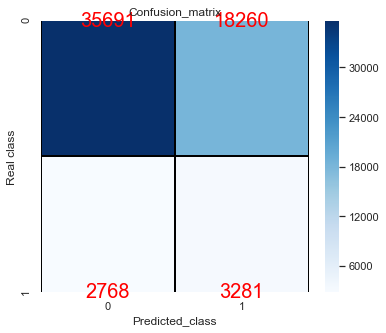

              precision    recall  f1-score   support

           0       0.93      0.66      0.77     53951
           1       0.15      0.54      0.24      6049

    accuracy                           0.65     60000
   macro avg       0.54      0.60      0.51     60000
weighted avg       0.85      0.65      0.72     60000



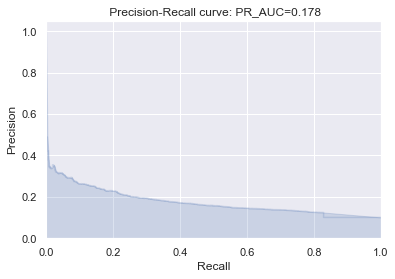

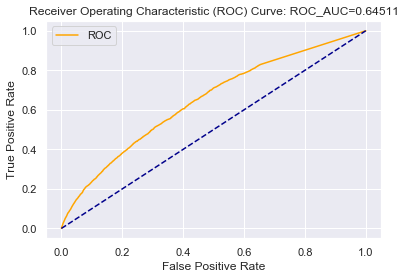

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed: 35.9min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.4s finished


RF_model
unsampled


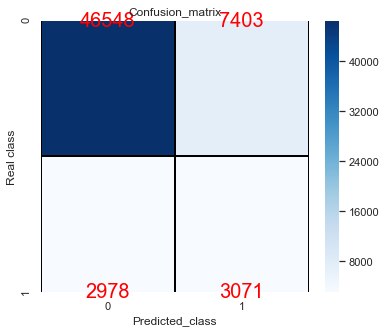

              precision    recall  f1-score   support

           0       0.94      0.86      0.90     53951
           1       0.29      0.51      0.37      6049

    accuracy                           0.83     60000
   macro avg       0.62      0.69      0.64     60000
weighted avg       0.87      0.83      0.85     60000



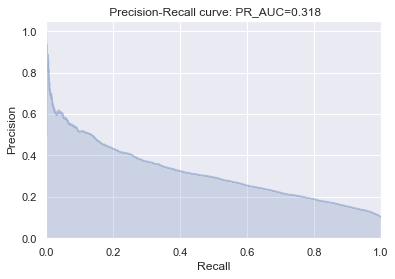

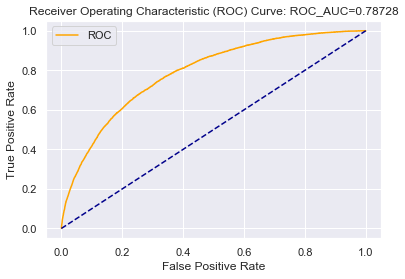

LR model prediction
unsampled


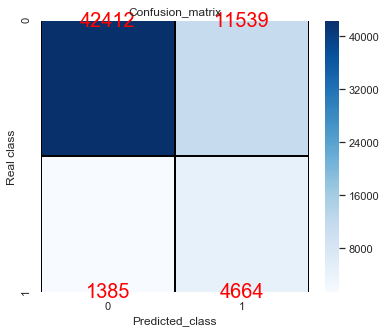

              precision    recall  f1-score   support

           0       0.97      0.79      0.87     53951
           1       0.29      0.77      0.42      6049

    accuracy                           0.78     60000
   macro avg       0.63      0.78      0.64     60000
weighted avg       0.90      0.78      0.82     60000



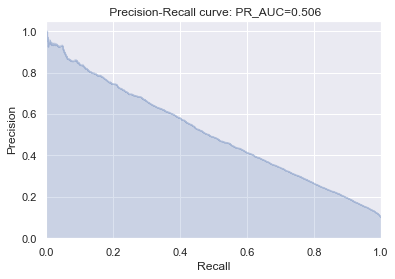

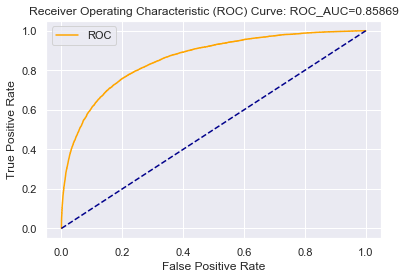

NB model prediction
unsampled


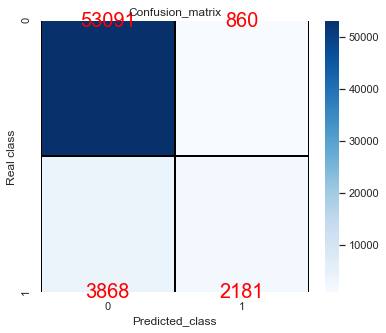

              precision    recall  f1-score   support

           0       0.93      0.98      0.96     53951
           1       0.72      0.36      0.48      6049

    accuracy                           0.92     60000
   macro avg       0.82      0.67      0.72     60000
weighted avg       0.91      0.92      0.91     60000



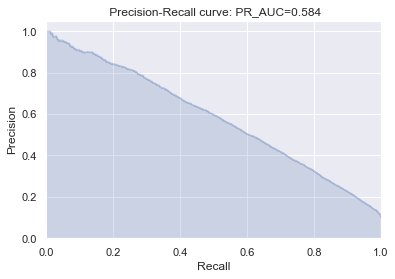

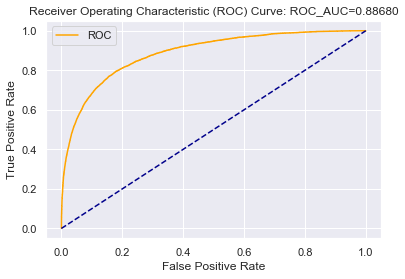

C50_Tree
RUS


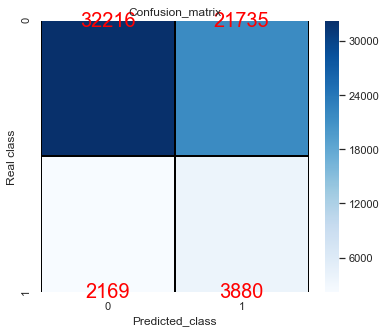

              precision    recall  f1-score   support

           0       0.94      0.60      0.73     53951
           1       0.15      0.64      0.25      6049

    accuracy                           0.60     60000
   macro avg       0.54      0.62      0.49     60000
weighted avg       0.86      0.60      0.68     60000



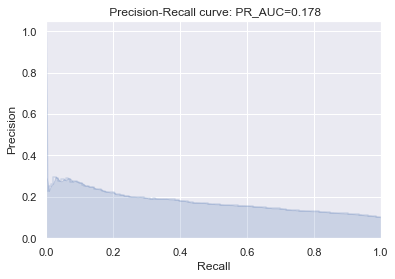

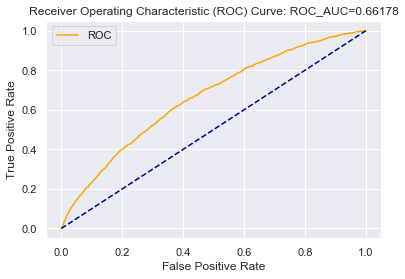

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  4.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.9s finished


RF_model
RUS


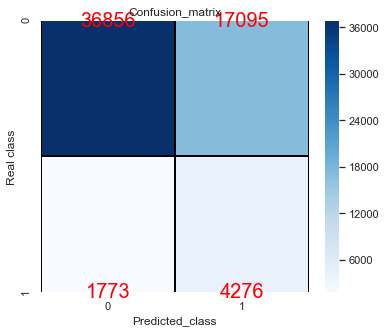

              precision    recall  f1-score   support

           0       0.95      0.68      0.80     53951
           1       0.20      0.71      0.31      6049

    accuracy                           0.69     60000
   macro avg       0.58      0.70      0.55     60000
weighted avg       0.88      0.69      0.75     60000



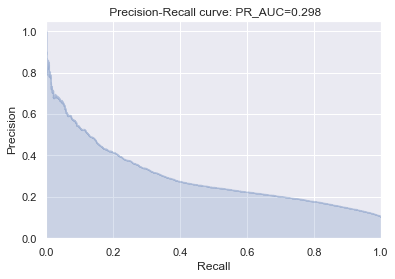

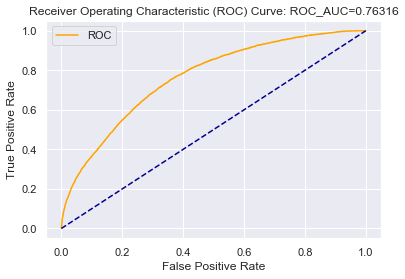

LR model prediction
RUS


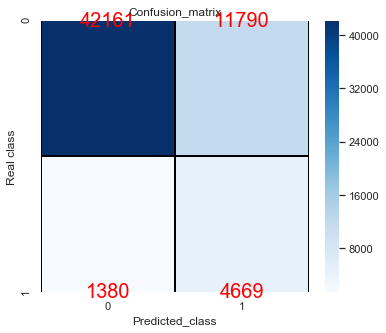

              precision    recall  f1-score   support

           0       0.97      0.78      0.86     53951
           1       0.28      0.77      0.41      6049

    accuracy                           0.78     60000
   macro avg       0.63      0.78      0.64     60000
weighted avg       0.90      0.78      0.82     60000



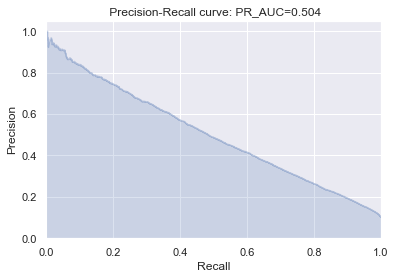

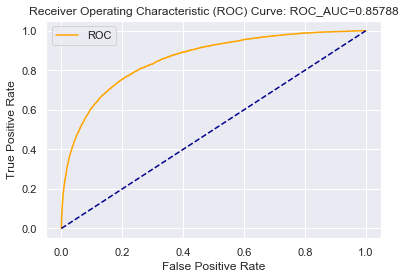

NB model prediction
RUS


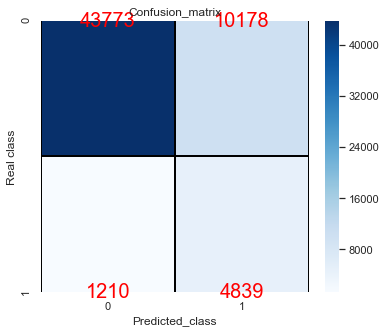

              precision    recall  f1-score   support

           0       0.97      0.81      0.88     53951
           1       0.32      0.80      0.46      6049

    accuracy                           0.81     60000
   macro avg       0.65      0.81      0.67     60000
weighted avg       0.91      0.81      0.84     60000



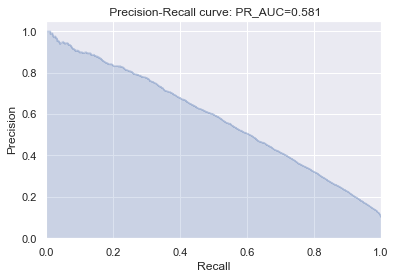

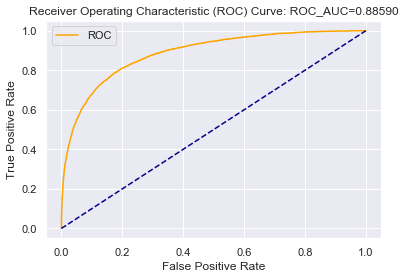

C50_Tree
ROS


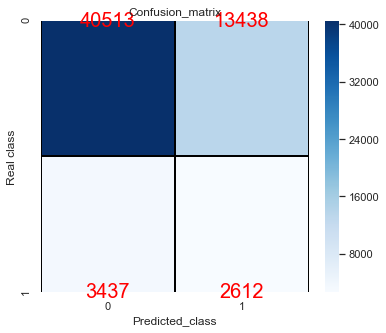

              precision    recall  f1-score   support

           0       0.92      0.75      0.83     53951
           1       0.16      0.43      0.24      6049

    accuracy                           0.72     60000
   macro avg       0.54      0.59      0.53     60000
weighted avg       0.85      0.72      0.77     60000



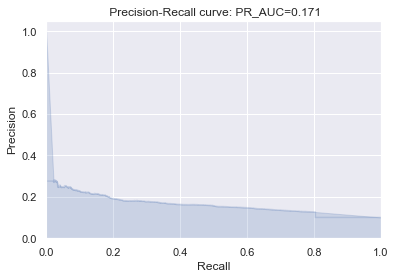

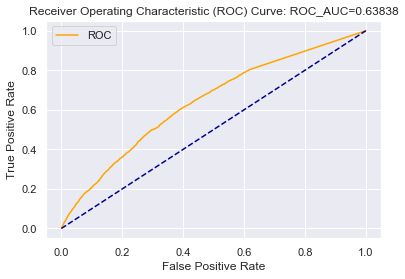

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed: 59.9min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.6s finished


RF_model
ROS


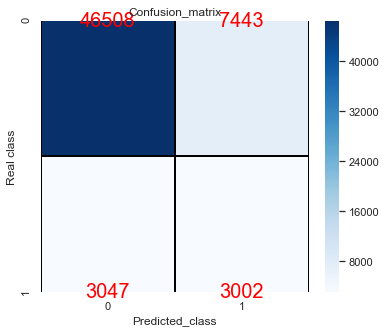

              precision    recall  f1-score   support

           0       0.94      0.86      0.90     53951
           1       0.29      0.50      0.36      6049

    accuracy                           0.83     60000
   macro avg       0.61      0.68      0.63     60000
weighted avg       0.87      0.83      0.84     60000



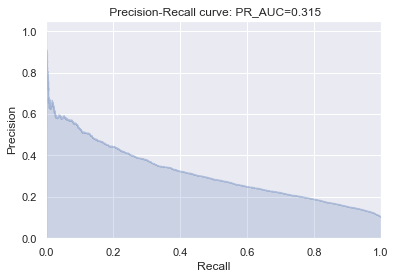

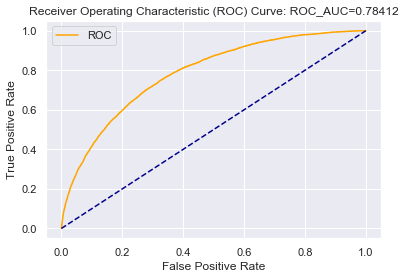

LR model prediction
ROS


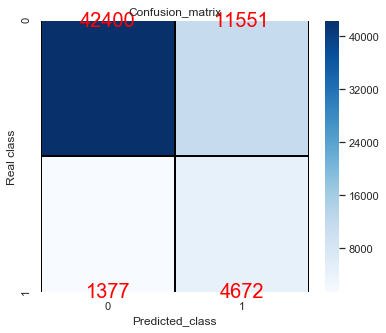

              precision    recall  f1-score   support

           0       0.97      0.79      0.87     53951
           1       0.29      0.77      0.42      6049

    accuracy                           0.78     60000
   macro avg       0.63      0.78      0.64     60000
weighted avg       0.90      0.78      0.82     60000



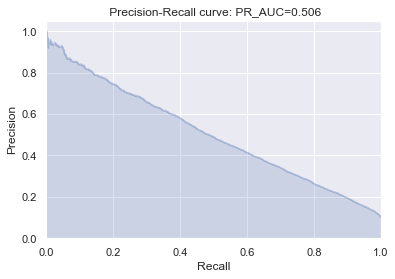

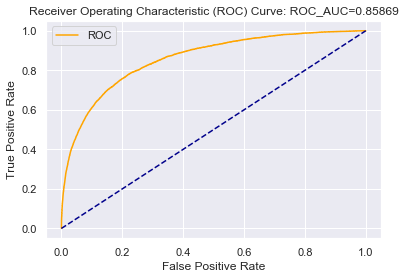

NB model prediction
ROS


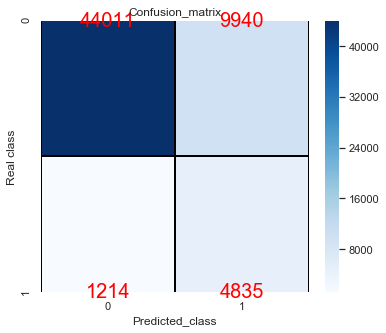

              precision    recall  f1-score   support

           0       0.97      0.82      0.89     53951
           1       0.33      0.80      0.46      6049

    accuracy                           0.81     60000
   macro avg       0.65      0.81      0.68     60000
weighted avg       0.91      0.81      0.84     60000



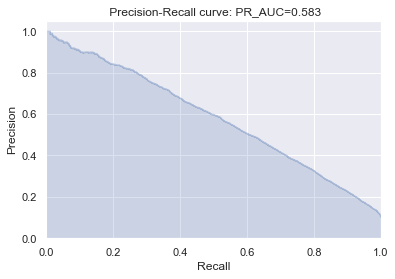

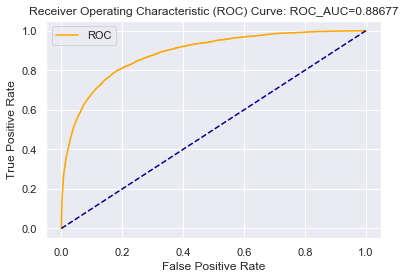

C50_Tree
SMOTE


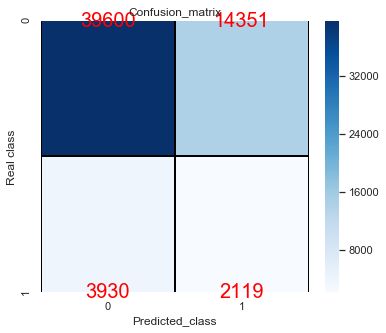

              precision    recall  f1-score   support

           0       0.91      0.73      0.81     53951
           1       0.13      0.35      0.19      6049

    accuracy                           0.70     60000
   macro avg       0.52      0.54      0.50     60000
weighted avg       0.83      0.70      0.75     60000



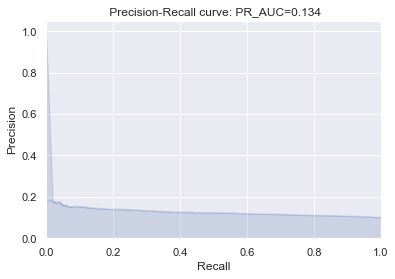

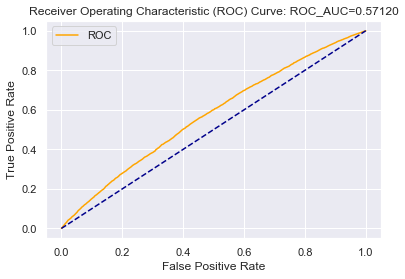

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed: 78.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.6s finished


RF_model
SMOTE


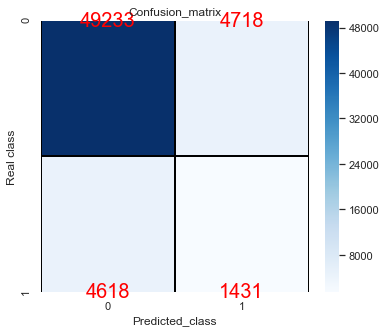

              precision    recall  f1-score   support

           0       0.91      0.91      0.91     53951
           1       0.23      0.24      0.23      6049

    accuracy                           0.84     60000
   macro avg       0.57      0.57      0.57     60000
weighted avg       0.85      0.84      0.84     60000



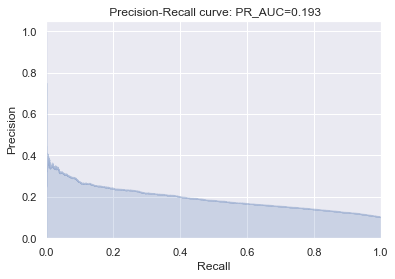

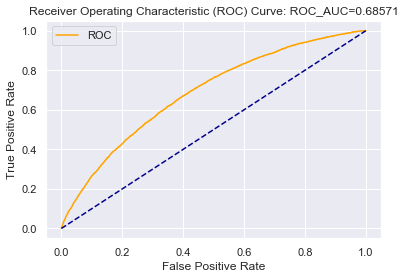

LR model prediction
SMOTE


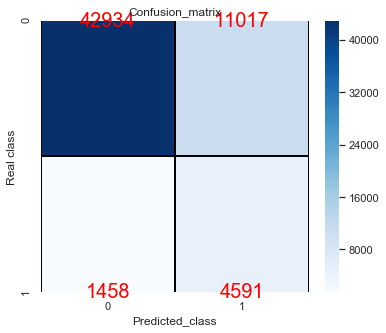

              precision    recall  f1-score   support

           0       0.97      0.80      0.87     53951
           1       0.29      0.76      0.42      6049

    accuracy                           0.79     60000
   macro avg       0.63      0.78      0.65     60000
weighted avg       0.90      0.79      0.83     60000



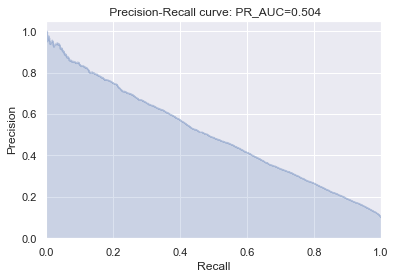

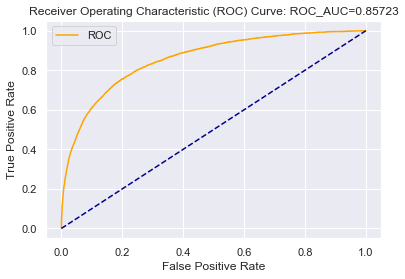

NB model prediction
SMOTE


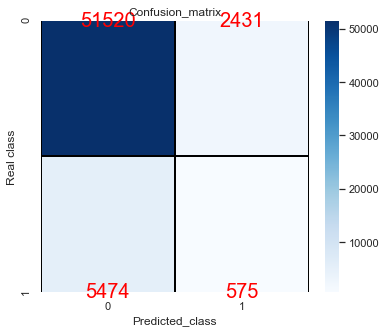

              precision    recall  f1-score   support

           0       0.90      0.95      0.93     53951
           1       0.19      0.10      0.13      6049

    accuracy                           0.87     60000
   macro avg       0.55      0.52      0.53     60000
weighted avg       0.83      0.87      0.85     60000



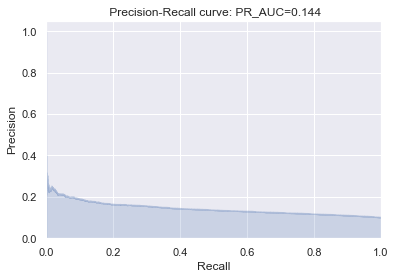

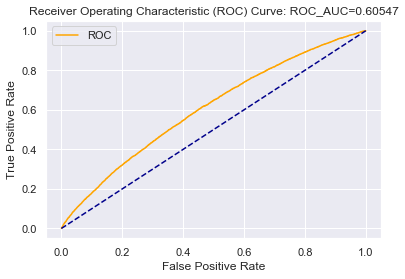

In [38]:
mc = Model_Creation()
for xt,yt,st in zip(X_train_list,y_train_list,st_list):
    mc.c50_modelcreation(st,xt,X_test,yt,y_test,True)
    mc.RF_modelcreation(st,xt,X_test,yt,y_test,True)
    mc.LR_modelcreation(st,xt,X_test,yt,y_test,True)
    mc.NB_modelcreation(st,xt,X_test,yt,y_test,True)

C50_Tree
unsampled


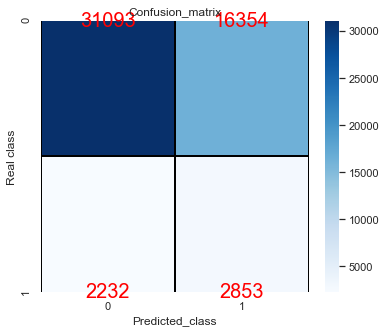

              precision    recall  f1-score   support

           0       0.93      0.66      0.77     47447
           1       0.15      0.56      0.23      5085

    accuracy                           0.65     52532
   macro avg       0.54      0.61      0.50     52532
weighted avg       0.86      0.65      0.72     52532



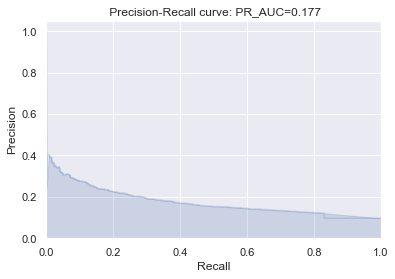

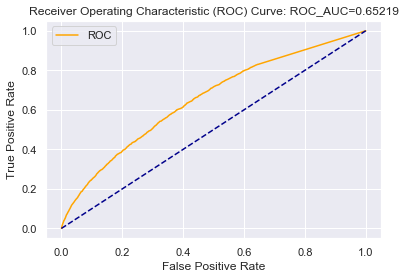

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed: 29.4min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.2s finished


RF_model
unsampled


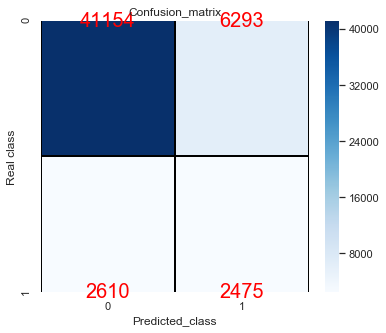

              precision    recall  f1-score   support

           0       0.94      0.87      0.90     47447
           1       0.28      0.49      0.36      5085

    accuracy                           0.83     52532
   macro avg       0.61      0.68      0.63     52532
weighted avg       0.88      0.83      0.85     52532



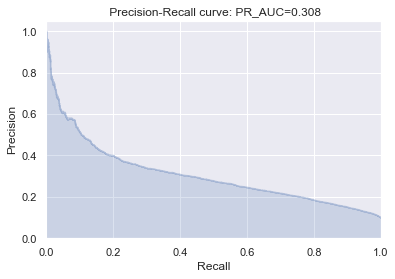

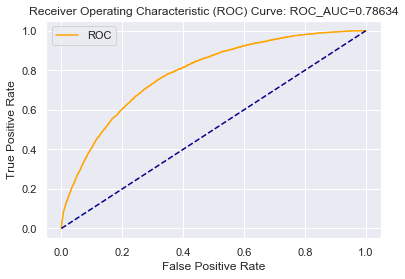

LR model prediction
unsampled


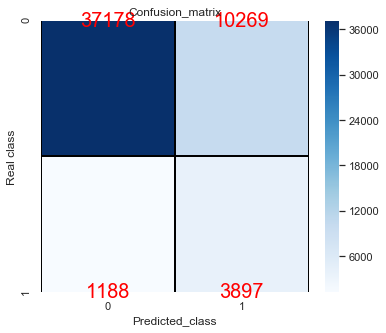

              precision    recall  f1-score   support

           0       0.97      0.78      0.87     47447
           1       0.28      0.77      0.40      5085

    accuracy                           0.78     52532
   macro avg       0.62      0.77      0.64     52532
weighted avg       0.90      0.78      0.82     52532



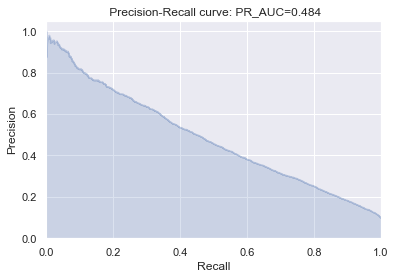

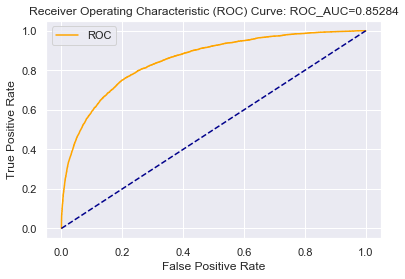

NB model prediction
unsampled


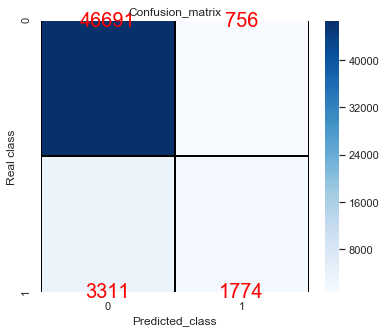

              precision    recall  f1-score   support

           0       0.93      0.98      0.96     47447
           1       0.70      0.35      0.47      5085

    accuracy                           0.92     52532
   macro avg       0.82      0.67      0.71     52532
weighted avg       0.91      0.92      0.91     52532



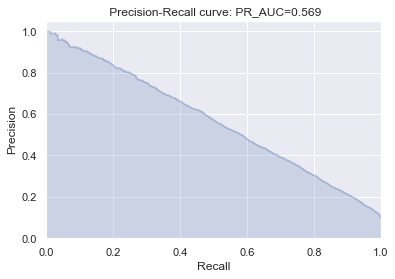

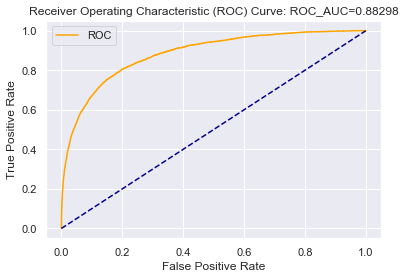

C50_Tree
RUS


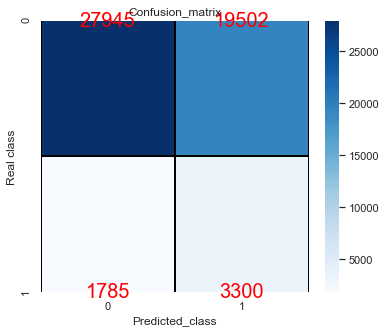

              precision    recall  f1-score   support

           0       0.94      0.59      0.72     47447
           1       0.14      0.65      0.24      5085

    accuracy                           0.59     52532
   macro avg       0.54      0.62      0.48     52532
weighted avg       0.86      0.59      0.68     52532



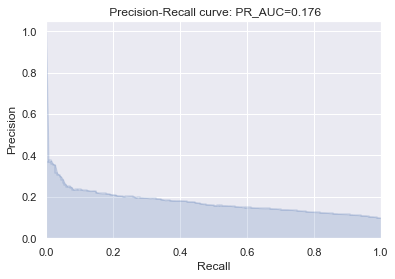

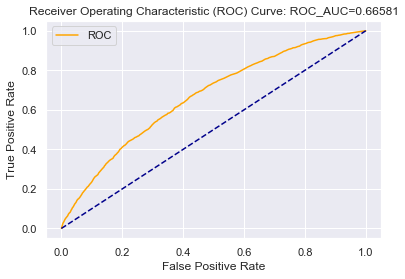

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  3.2min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished


RF_model
RUS


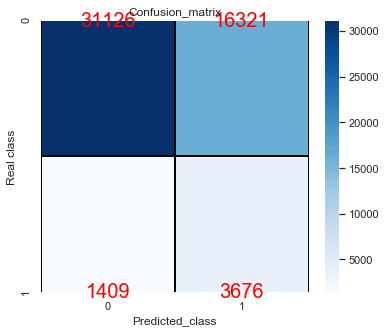

              precision    recall  f1-score   support

           0       0.96      0.66      0.78     47447
           1       0.18      0.72      0.29      5085

    accuracy                           0.66     52532
   macro avg       0.57      0.69      0.54     52532
weighted avg       0.88      0.66      0.73     52532



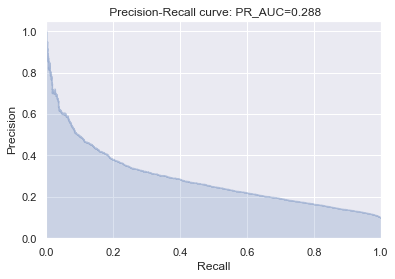

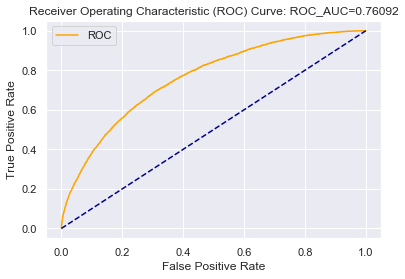

LR model prediction
RUS


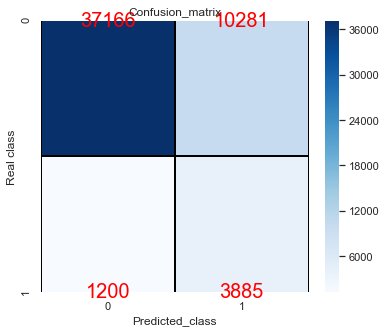

              precision    recall  f1-score   support

           0       0.97      0.78      0.87     47447
           1       0.27      0.76      0.40      5085

    accuracy                           0.78     52532
   macro avg       0.62      0.77      0.63     52532
weighted avg       0.90      0.78      0.82     52532



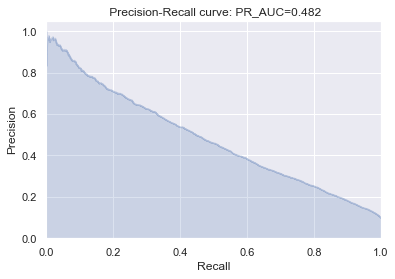

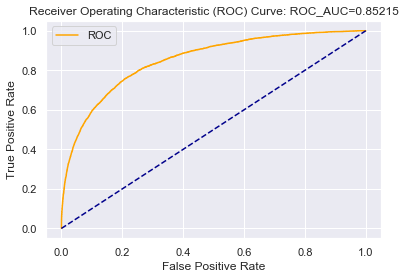

NB model prediction
RUS


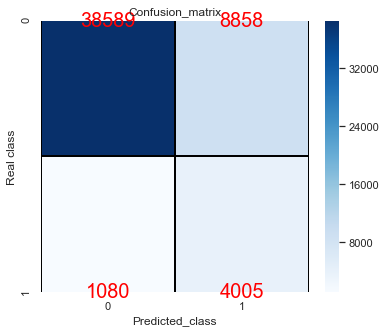

              precision    recall  f1-score   support

           0       0.97      0.81      0.89     47447
           1       0.31      0.79      0.45      5085

    accuracy                           0.81     52532
   macro avg       0.64      0.80      0.67     52532
weighted avg       0.91      0.81      0.84     52532



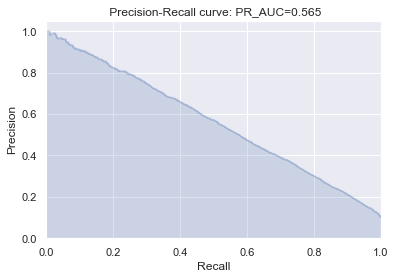

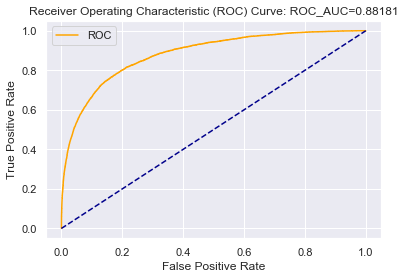

C50_Tree
ROS


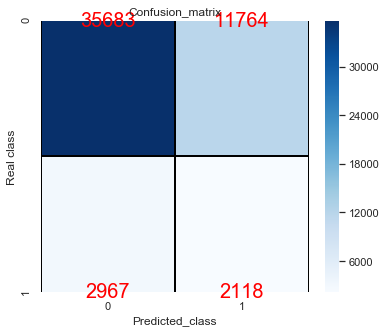

              precision    recall  f1-score   support

           0       0.92      0.75      0.83     47447
           1       0.15      0.42      0.22      5085

    accuracy                           0.72     52532
   macro avg       0.54      0.58      0.53     52532
weighted avg       0.85      0.72      0.77     52532



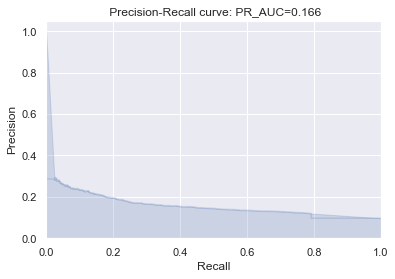

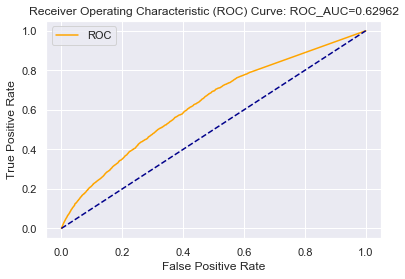

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed: 49.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.4s finished


RF_model
ROS


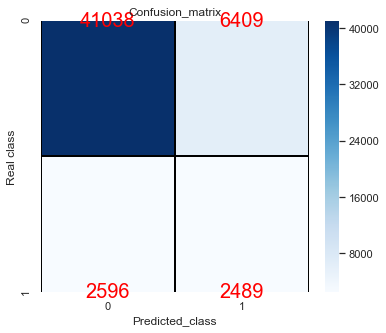

              precision    recall  f1-score   support

           0       0.94      0.86      0.90     47447
           1       0.28      0.49      0.36      5085

    accuracy                           0.83     52532
   macro avg       0.61      0.68      0.63     52532
weighted avg       0.88      0.83      0.85     52532



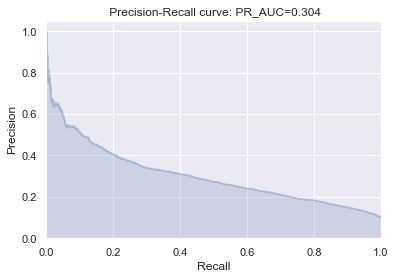

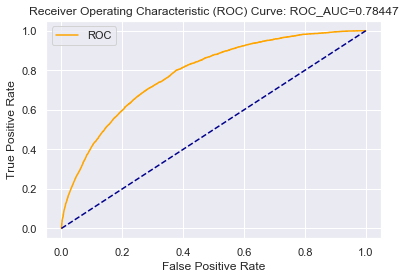

LR model prediction
ROS


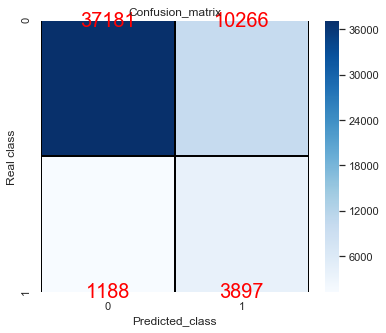

              precision    recall  f1-score   support

           0       0.97      0.78      0.87     47447
           1       0.28      0.77      0.40      5085

    accuracy                           0.78     52532
   macro avg       0.62      0.78      0.64     52532
weighted avg       0.90      0.78      0.82     52532



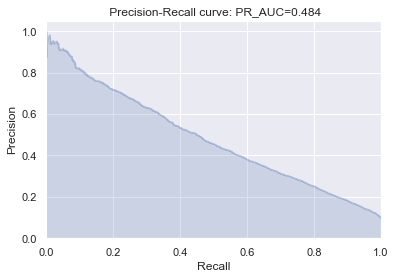

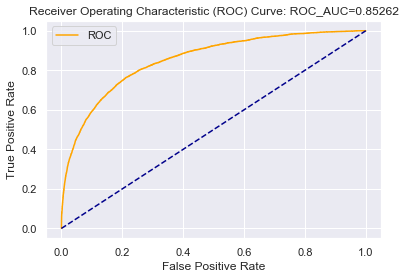

NB model prediction
ROS


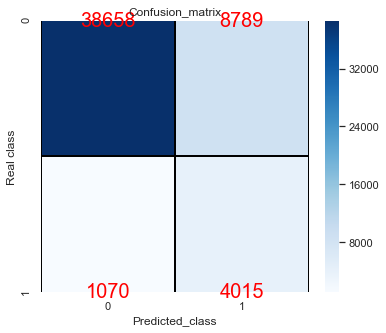

              precision    recall  f1-score   support

           0       0.97      0.81      0.89     47447
           1       0.31      0.79      0.45      5085

    accuracy                           0.81     52532
   macro avg       0.64      0.80      0.67     52532
weighted avg       0.91      0.81      0.84     52532



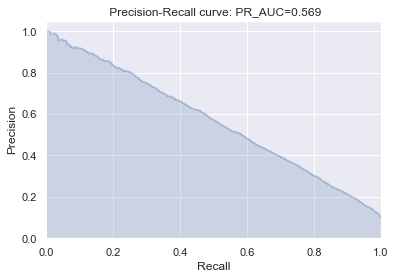

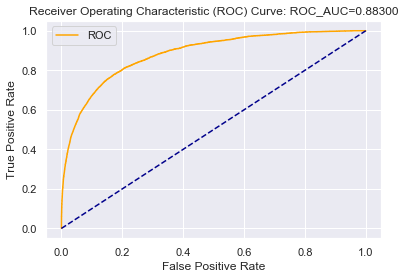

C50_Tree
SMOTE


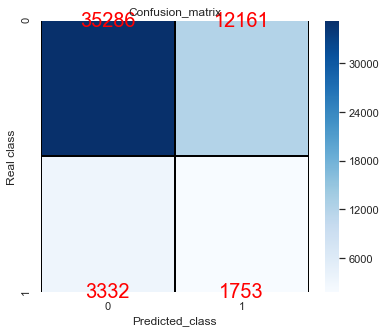

              precision    recall  f1-score   support

           0       0.91      0.74      0.82     47447
           1       0.13      0.34      0.18      5085

    accuracy                           0.71     52532
   macro avg       0.52      0.54      0.50     52532
weighted avg       0.84      0.71      0.76     52532



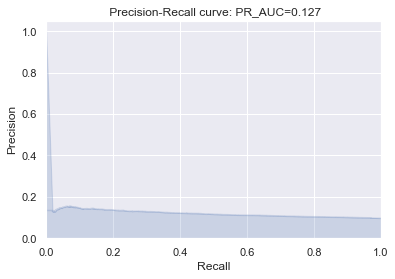

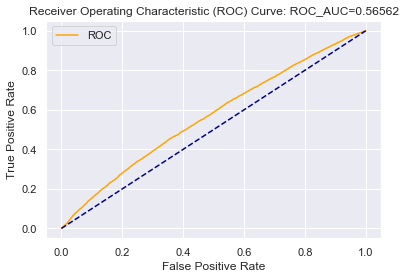

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed: 72.6min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.3s finished


RF_model
SMOTE


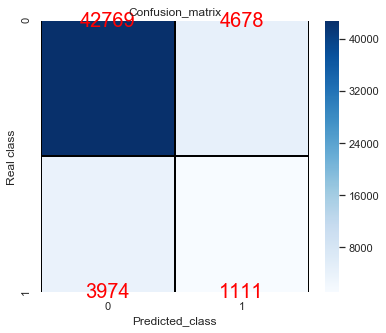

              precision    recall  f1-score   support

           0       0.91      0.90      0.91     47447
           1       0.19      0.22      0.20      5085

    accuracy                           0.84     52532
   macro avg       0.55      0.56      0.56     52532
weighted avg       0.84      0.84      0.84     52532



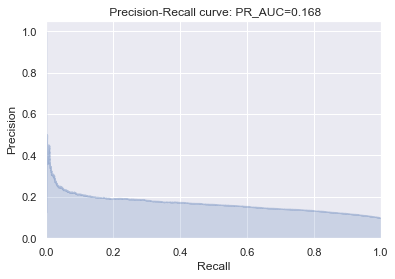

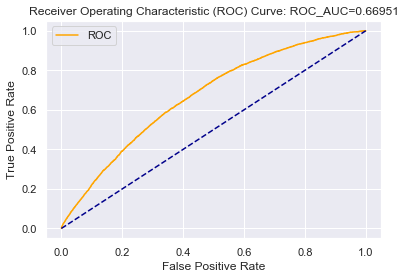

LR model prediction
SMOTE


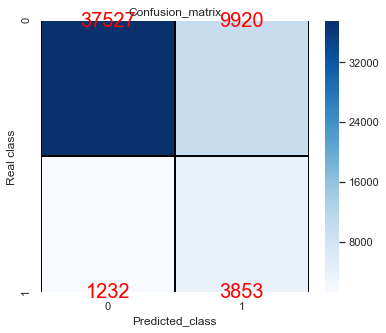

              precision    recall  f1-score   support

           0       0.97      0.79      0.87     47447
           1       0.28      0.76      0.41      5085

    accuracy                           0.79     52532
   macro avg       0.62      0.77      0.64     52532
weighted avg       0.90      0.79      0.83     52532



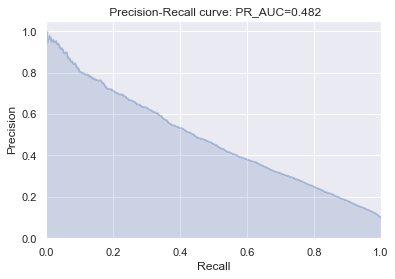

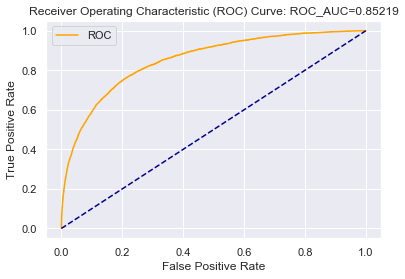

NB model prediction
SMOTE


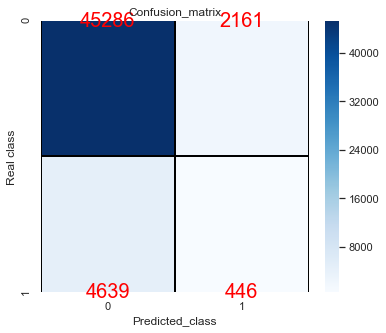

              precision    recall  f1-score   support

           0       0.91      0.95      0.93     47447
           1       0.17      0.09      0.12      5085

    accuracy                           0.87     52532
   macro avg       0.54      0.52      0.52     52532
weighted avg       0.84      0.87      0.85     52532



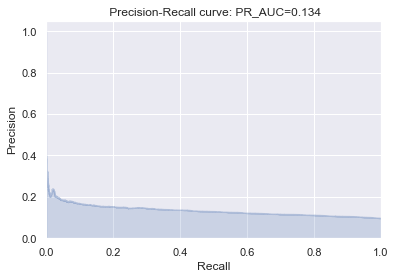

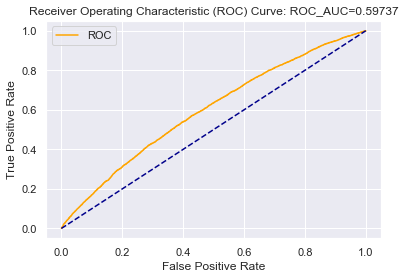

In [39]:
for xt,yt,st in zip(wo_X_train_list,wo_y_train_list,st_list):
    mc.c50_modelcreation(st,xt,wo_X_test,yt,wo_y_test,False)
    mc.RF_modelcreation(st,xt,wo_X_test,yt,wo_y_test,False)
    mc.LR_modelcreation(st,xt,wo_X_test,yt,wo_y_test,False)
    mc.NB_modelcreation(st,xt,wo_X_test,yt,wo_y_test,False)

In [61]:
All_Model = mc.modelperformance.append(wo_mc.modelperformance, ignore_index=True)
All_Model

,Model,ST,Outliers,TN,FN,TP,FP,FNR,FPR,Recall,Specificity,accuracy,precession
0,C50_Tree,unsampled,True,35691,2768,3281,18260,45.759630,33.845526,54.240370,66.154474,64.953333,15.231419
1,RF,unsampled,True,46548,2978,3071,7403,49.231278,13.721710,50.768722,86.278290,82.698333,29.320222
2,LR,unsampled,True,42412,1385,4664,11539,22.896347,21.387926,77.103653,78.612074,78.460000,28.784793
3,NB,unsampled,True,53091,3868,2181,860,63.944454,1.594039,36.055546,98.405961,92.120000,71.719829
4,C50_Tree,RUS,True,32216,2169,3880,21735,35.857166,40.286556,64.142834,59.713444,60.160000,15.147375
5,RF,RUS,True,36856,1773,4276,17095,29.310630,31.686160,70.689370,68.313840,68.553333,20.008423
6,LR,RUS,True,42161,1380,4669,11790,22.813688,21.853163,77.186312,78.146837,78.050000,28.367459
7,NB,RUS,True,43773,1210,4839,10178,20.003306,18.865267,79.996694,81.134733,81.020000,32.223480
8,C50_Tree,ROS,True,40513,3437,2612,13438,56.819309,24.907787,43.180691,75.092213,71.875000,16.274143
9,RF,ROS,True,46508,3047,3002,7443,50.371962,13.795852,49.628038,86.204148,82.516667,28.741024


If we see closely the Naive Bayes is performing best among all c50 tree is performing the worst so we will concentrate on NB

In [62]:
All_Model[All_Model['Model']=='NB']

,Model,ST,Outliers,TN,FN,TP,FP,FNR,FPR,Recall,Specificity,accuracy,precession
3,NB,unsampled,True,53091,3868,2181,860,63.944454,1.594039,36.055546,98.405961,92.120000,71.719829
7,NB,RUS,True,43773,1210,4839,10178,20.003306,18.865267,79.996694,81.134733,81.020000,32.223480
11,NB,ROS,True,44011,1214,4835,9940,20.069433,18.424126,79.930567,81.575874,81.410000,32.724196
15,NB,SMOTE,True,51520,5474,575,2431,90.494297,4.505941,9.505703,95.494059,86.825000,19.128410
19,NB,unsampled,False,46691,3311,1774,756,65.113078,1.593357,34.886922,98.406643,92.258052,70.118577
23,NB,RUS,False,38589,1080,4005,8858,21.238938,18.669252,78.761062,81.330748,81.082007,31.135816
27,NB,ROS,False,38658,1070,4015,8789,21.042281,18.523827,78.957719,81.476173,81.232392,31.357388
31,NB,SMOTE,False,45286,4639,446,2161,91.229105,4.554556,8.770895,95.445444,87.055509,17.107787


here also SMOTE is not performing well and by removing the outliers the performance is decreased slightly so its mean that outliers are carrying some relevant information as expected earlier 

In [76]:
All_Model[(All_Model['Model']=='NB') & (All_Model['ST'].isin(['unsampled','ROS']))  & (All_Model['Outliers']==True) ]

,Model,ST,Outliers,TN,FN,TP,FP,FNR,FPR,Recall,Specificity,accuracy,precession
3,NB,unsampled,True,53091,3868,2181,860,63.944454,1.594039,36.055546,98.405961,92.12,71.719829
11,NB,ROS,True,44011,1214,4835,9940,20.069433,18.424126,79.930567,81.575874,81.41,32.724196


there is tradeoff between TP and FP The ROS is sampled model is providing  better recall and specficity but the precission is decreased
but it is the most suitable model as it is able to predict most of the Positive case 

### we tried other ensemble learning method of different method like Bagging,boostingand,stacking but still there is no improvement   

NB model prediction
ROS


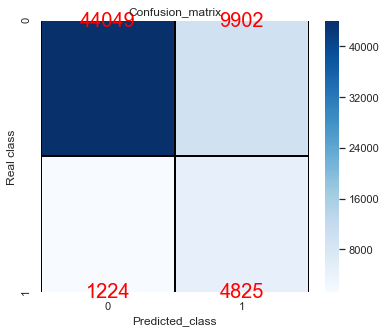

              precision    recall  f1-score   support

           0       0.97      0.82      0.89     53951
           1       0.33      0.80      0.46      6049

    accuracy                           0.81     60000
   macro avg       0.65      0.81      0.68     60000
weighted avg       0.91      0.81      0.85     60000



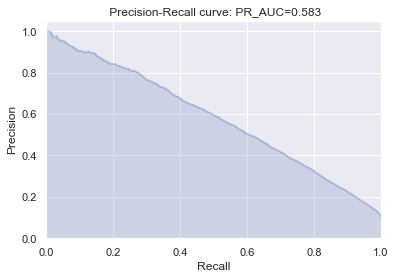

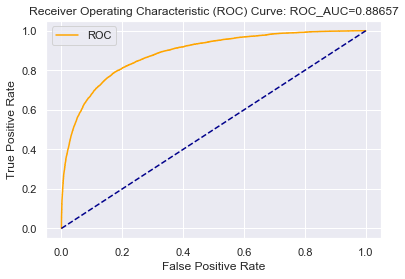

In [134]:
mc = Model_Creation()
mc.NB_modelcreation('ROS',X_ros,X_test,y_ros,y_test,True)

import test data

In [90]:
test_data = pd.read_csv('test.csv', low_memory=True ,memory_map= True)

In [29]:
test_data.head()

,ID_code,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,test_0,11.0656,7.7798,12.9536,9.4292,11.4327,-2.3805,5.8493,18.2675,2.1337,...,-2.1556,11.8495,-1.4300,2.4508,13.7112,2.4669,4.3654,10.7200,15.4722,-8.7197
1,test_1,8.5304,1.2543,11.3047,5.1858,9.1974,-4.0117,6.0196,18.6316,-4.4131,...,10.6165,8.8349,0.9403,10.1282,15.5765,0.4773,-1.4852,9.8714,19.1293,-20.9760
2,test_2,5.4827,-10.3581,10.1407,7.0479,10.2628,9.8052,4.8950,20.2537,1.5233,...,-0.7484,10.9935,1.9803,2.1800,12.9813,2.1281,-7.1086,7.0618,19.8956,-23.1794
3,test_3,8.5374,-1.3222,12.0220,6.5749,8.8458,3.1744,4.9397,20.5660,3.3755,...,9.5702,9.0766,1.6580,3.5813,15.1874,3.1656,3.9567,9.2295,13.0168,-4.2108
4,test_4,11.7058,-0.1327,14.1295,7.7506,9.1035,-8.5848,6.8595,10.6048,2.9890,...,4.2259,9.1723,1.2835,3.3778,19.5542,-0.2860,-5.1612,7.2882,13.9260,-9.1846


In [91]:
test_data.describe()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,10.658737,-1.624244,10.707452,6.788214,11.076399,-5.050558,5.415164,16.529143,0.277135,7.569407,...,3.189766,7.458269,1.925944,3.322016,17.996967,-0.133657,2.290899,8.912428,15.869184,-3.246342
std,3.036716,4.040509,2.633888,2.052724,1.616456,7.869293,0.864686,3.424482,3.333375,1.231865,...,4.551239,3.025189,1.479966,3.995599,3.140652,1.429678,5.446346,0.920904,3.008717,10.398589
min,0.188700,-15.043400,2.355200,-0.022400,5.484400,-27.767000,2.216400,5.713700,-9.956000,4.243300,...,-14.093300,-2.407000,-3.340900,-11.413100,9.382800,-4.911900,-13.944200,6.169600,6.584000,-39.457800
25%,8.442975,-4.700125,8.735600,5.230500,9.891075,-11.201400,4.772600,13.933900,-2.303900,6.623800,...,-0.095000,5.166500,0.882975,0.587600,15.634775,-1.160700,-1.948600,8.260075,13.847275,-11.124000
50%,10.513800,-1.590500,10.560700,6.822350,11.099750,-4.834100,5.391600,16.422700,0.372000,7.632000,...,3.162400,7.379000,1.892600,3.428500,17.977600,-0.162000,2.403600,8.892800,15.943400,-2.725950
75%,12.739600,1.343400,12.495025,8.327600,12.253400,0.942575,6.005800,19.094550,2.930025,8.584825,...,6.336475,9.531100,2.956000,6.174200,20.391725,0.837900,6.519800,9.595900,18.045200,4.935400
max,22.323400,9.385100,18.714100,13.142000,16.037100,17.253700,8.302500,28.292800,9.665500,11.003600,...,20.359000,16.716500,8.005000,17.632600,27.947800,4.545400,15.920700,12.275800,26.538400,27.907400


checking missing data

In [31]:
missing_data_table =  pd.DataFrame(test_data.isna().sum())
missing_data_table.rename(columns = {'index': 'Variables', 0: 'missing_val_status'}, inplace=True)
missing_data_table

,missing_val_status
ID_code,0
var_0,0
var_1,0
var_2,0
var_3,0
...,...
var_195,0
var_196,0
var_197,0
var_198,0


In [32]:
missing_data_table[missing_data_table['missing_val_status'] >0]

,missing_val_status


there is no missing data

lets predict the value now

In [112]:
array_test_data = test_data.iloc[:,1:].to_numpy()

In [128]:
testpredict = mc.NB.predict(array_test_data)

In [129]:
submission = test_data

In [130]:
submission['target'] = testpredict

In [132]:
submission.to_csv('submission1.csv')